**Autor:** Fabio Miguel de Barros Albuquerque

**Orientador:** Prof. Dr. Guilherme André Peleglini Rocha

**Data da Última Modificação:** 31/08/2024

**Descrição**
Este script faz parte do Trabalho de Conclusão de Curso (TCC) intitulado
Otimização da distribuição de estoque de joias: modelos preditivos no mercado de luxo “second hand”, apresentado ao MBA em Data Science e Analytics da USP/Esalq.

O objetivo deste código é aplicar a Análise de Correspondência Múltipla (ACM) para explorar as associações entre as variáveis categóricas presentes no conjunto de dados. A ACM é uma técnica de análise multivariada que permite reduzir a dimensionalidade dos dados e visualizar as relações de afinidade entre as categorias das variáveis em um mapa perceptual de poucas dimensões.

A análise visa identificar perfis ou agrupamentos de observações com características similares e compreender a estrutura subjacente dos dados, contribuindo para responder ao problema de pesquisa proposto no TCC.

#Instalar e Importar pacotes

###Instalação dos pacotes

In [1]:
!pip install prince==0.7.1
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install scikit-learn
!pip install xgboost
!pip install statstests

###Importa os pacotes

In [2]:
import pandas as pd #manipulação de dados em formato de dataframe
import numpy as np #biblioteca para operações matemáticas multidimensionais
import matplotlib.pyplot as plt #biblioteca de visualização de dados
import seaborn as sns #biblioteca de visualização de informações estatísticas
import statsmodels.api as sm #cálculo de estatísticas da tabela de contingência
import statsmodels.formula.api as smf # estimação do modelo logístico binário
import prince #funções 'CA' e 'MCA' para elaboração direta da Anacor e da MCA
import plotly.graph_objects as go #biblioteca para gráficos interativos
import plotly.io as pio #biblioteca para gráficos interativos
pio.renderers.default = 'browser' #biblioteca para gráficos interativos


from scipy.stats import chi2_contingency #estatística qui-quadrado e teste
from scipy.stats.contingency import margins #cálculo manual dos resíduos padronizados
from scipy.linalg import svd #valores singulares e autovetores (eigenvectors)
from scipy import stats # estatística chi2
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_curve, auc, f1_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from statstests.process import stepwise # procedimento Stepwise
from statsmodels.iolib.summary2 import summary_col # comparação entre modelos
from statsmodels.discrete.discrete_model import MNLogit # estimação do modelo
                                                        #logístico multinomial

from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder #One Hot encoding para "dumização"
from itertools import combinations
from sklearn.preprocessing import label_binarize
from statsmodels.stats.outliers_influence import variance_inflation_factor
from tabulate import tabulate

import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.dpi'] = 600

###Cria função para cálculo do chi2

In [3]:
def Qui2(modelo_multinomial):
    maximo = modelo_multinomial.llf
    minimo = modelo_multinomial.llnull
    qui2 = -2*(minimo - maximo)
    pvalue = stats.distributions.chi2.sf(qui2,24)
    df = pd.DataFrame({'Qui quadrado':[qui2],
                       'pvalue':[pvalue]})
    return df

#Data Wrangling

##Carga e tratamento dos dados

###Carga de dados com histórico de vendas dos últimos 24 meses

In [4]:
df_vendas = pd.read_csv('https://github.com/mba-fabio/dsa_usp/raw/main/20250607_joias_simuladas_historico_24meses_sazonal.csv',sep=';')
df_vendas

# Características das variáveis do dataset
df_vendas.info()

# Estatísticas univariadas
df_vendas.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10038 entries, 0 to 10037
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   DATA        10038 non-null  object
 1   TIPO_JOIA   10038 non-null  object
 2   TIPO_PEDRA  10038 non-null  object
 3   TIPO_MARCA  10038 non-null  object
 4   LOJA        10038 non-null  object
 5   PRECO       10038 non-null  int64 
dtypes: int64(1), object(5)
memory usage: 470.7+ KB


,PRECO
count,10038.000000
mean,9343.824666
std,7310.434155
min,512.000000
25%,3588.000000
50%,7128.000000
75%,13186.000000
max,30240.000000


###Padronizando Data Frame para minúsculas

In [5]:
df_vendas.columns = df_vendas.columns.str.lower()

for col in df_vendas.columns:
    if df_vendas[col].dtype == 'object':
        df_vendas[col] = df_vendas[col].str.lower()

df_vendas.head()

,data,tipo_joia,tipo_pedra,tipo_marca,loja,preco
0,2022-01,colar,outras,internacional,a,11088
1,2022-01,brinco,diamante,nacional,a,6739
2,2022-01,anel,outras,internacional,a,5412
3,2022-01,pulseira,sem pedra,internacional,a,4482
4,2022-01,pulseira,diamante,nacional,a,9676


###Simplificando os nomes das colunas, para melhor visualização nos gráficos

In [6]:
df_vendas = df_vendas.rename(columns={'tipo_joia': 'joia', 'tipo_pedra': 'pedra', 'tipo_marca': 'marca'})
df_vendas.head()

,data,joia,pedra,marca,loja,preco
0,2022-01,colar,outras,internacional,a,11088
1,2022-01,brinco,diamante,nacional,a,6739
2,2022-01,anel,outras,internacional,a,5412
3,2022-01,pulseira,sem pedra,internacional,a,4482
4,2022-01,pulseira,diamante,nacional,a,9676


###Visualizando amostra de dados e tabelas de frequência das variáveis qualitativas

In [7]:
# Visualização da base de dados
print(df_vendas)

# Características das variáveis do dataset
print(df_vendas.info(),'\n')

# Tabelas de frequência das variáveis qualitativas
print(df_vendas['joia'].value_counts(),'\n')
print(df_vendas['pedra'].value_counts(),'\n')
print(df_vendas['marca'].value_counts(),'\n')
print(df_vendas['loja'].value_counts())

df_vendas['preco'].quantile([0.1, 0.25, 0.5, 0.75])

          data      joia      pedra          marca loja  preco
0      2022-01     colar     outras  internacional    a  11088
1      2022-01    brinco   diamante       nacional    a   6739
2      2022-01      anel     outras  internacional    a   5412
3      2022-01  pulseira  sem pedra  internacional    a   4482
4      2022-01  pulseira   diamante       nacional    a   9676
...        ...       ...        ...            ...  ...    ...
10033  2023-12  pingente  sem pedra       nacional    d    723
10034  2023-12      anel  sem pedra       nacional    d   1824
10035  2023-12      anel  sem pedra       nacional    d   1840
10036  2023-12    brinco  sem pedra       nacional    d   2412
10037  2023-12      anel  sem pedra       nacional    d   1872

[10038 rows x 6 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10038 entries, 0 to 10037
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   data    10038 non-null  object
 1

,preco
0.10,1632.0
0.25,3588.0
0.50,7128.0
0.75,13186.0


### Inclusão da faixa de preço como uma variável categórica

Transforma o preço em uma variável categórica, através da inclusão de uma "feature" com as faixas de preço ideais.

As faixas foram divididas com o seguinte critério:

1a. Faixa: 1º Decil (10%)

2a. Faixa: 1º Quartil (25%)

3a. Faixa: 2º Quartil/Mediana (50%)

4a. Faixa: 3º Quartil (75%)

5a. Faixa: Acima do 3º Quartil (> 75%)

In [8]:
quantiles = df_vendas['preco'].quantile([0.1, 0.25, 0.5, 0.75]).to_list()

def get_price_range(price):
    if price <= quantiles[0]:
        return f'0-{int(quantiles[0])}'
    elif price <= quantiles[1]:
        return f'{int(quantiles[0])+1}-{int(quantiles[1])}'
    elif price <= quantiles[2]:
        return f'{int(quantiles[1])+1}-{int(quantiles[2])}'
    elif price <= quantiles[3]:
        return f'{int(quantiles[2])+1}-{int(quantiles[3])}'
    else:
        return f'{int(quantiles[3])+1}-Max'

df_vendas['fx_preco'] = df_vendas['preco'].apply(get_price_range)
df_vendas.head()


,data,joia,pedra,marca,loja,preco,fx_preco
0,2022-01,colar,outras,internacional,a,11088,7129-13186
1,2022-01,brinco,diamante,nacional,a,6739,3589-7128
2,2022-01,anel,outras,internacional,a,5412,3589-7128
3,2022-01,pulseira,sem pedra,internacional,a,4482,3589-7128
4,2022-01,pulseira,diamante,nacional,a,9676,7129-13186


###Identifica as colunas categóricas e numéricas para facilitar os próximos passos

In [9]:
features_categoricas = ['joia', 'pedra', 'marca']

features_numericas = ['preco']

features_ordinais = ['fx_preco']

fx_preco_ordinal = {
    '0-1632': 0,
    '1633-3588': 1,
    '3589-7128': 2,
    '7129-13186': 3,
    '13187-Max':4
    }



###Remove a feature data, pois não acrescenta valor às análises exploratória e preditiva

In [10]:
df_vendas = df_vendas.drop('data', axis=1)
df_vendas.head()

,joia,pedra,marca,loja,preco,fx_preco
0,colar,outras,internacional,a,11088,7129-13186
1,brinco,diamante,nacional,a,6739,3589-7128
2,anel,outras,internacional,a,5412,3589-7128
3,pulseira,sem pedra,internacional,a,4482,3589-7128
4,pulseira,diamante,nacional,a,9676,7129-13186


#Análise Exploratória - ACM

##Análise de Correspondência Múltipla

### Para análise exploratória, o preço será analisado através da faixa criada na etapa de Data Wrangling

In [11]:
df_vendas_acm = df_vendas.drop('preco', axis=1)
df_vendas_acm.head()

,joia,pedra,marca,loja,fx_preco
0,colar,outras,internacional,a,7129-13186
1,brinco,diamante,nacional,a,3589-7128
2,anel,outras,internacional,a,3589-7128
3,pulseira,sem pedra,internacional,a,3589-7128
4,pulseira,diamante,nacional,a,7129-13186


###Tabelas de contingência com frequências absolutas observadas e esperadas, bem como os testes qui-quadrado

In [12]:
#Algoritmo para geração destas tabelas de contingência para os pares de variáveis categóricas presentes no dataframe 'df'
for item in list(combinations(df_vendas_acm.columns, 2)):
    print(item, "\n")
    tabela = pd.crosstab(df_vendas_acm[item[0]], df_vendas_acm[item[1]])

    print(tabela, "\n")

    chi2, pvalor, gl, freq_esp = chi2_contingency(tabela)

    print(f"estatística qui²: {chi2}") # estatística qui²
    print(f"p-valor da estatística: {pvalor}") # p-valor da estatística
    print(f"graus de liberdade: {gl} \n") # graus de liberdade
# Adicionando uma interpretação direta para facilitar a análise
    if pvalor < 0.05:
        print("  Resultado: Há evidência de associação estatisticamente significante entre as variáveis (p < 0.05).\n")
    else:
        print("  Resultado: Não há evidência de associação estatisticamente significante entre as variáveis (p >= 0.05).\n")


('joia', 'pedra') 

pedra     diamante  outras  sem pedra
joia                                 
anel           583     923        609
brinco         523    1287        362
colar         1016     781        292
pingente       365     525        502
pulseira       947    1007        316 

estatística qui²: 763.4000160608294
p-valor da estatística: 1.5857175941076157e-159
graus de liberdade: 8 

  Resultado: Há evidência de associação estatisticamente significante entre as variáveis (p < 0.05).

('joia', 'marca') 

marca     internacional  nacional
joia                             
anel                953      1162
brinco             1227       945
colar              1452       637
pingente            608       784
pulseira           1532       738 

estatística qui²: 459.60762246469767
p-valor da estatística: 3.636770013207591e-98
graus de liberdade: 4 

  Resultado: Há evidência de associação estatisticamente significante entre as variáveis (p < 0.05).

('joia', 'loja') 

loja         a

###Ajustando as variáveis para type = 'category' no dataframe 'df'

In [13]:
df_vendas_acm = df_vendas_acm.astype('category')
df_vendas_acm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10038 entries, 0 to 10037
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   joia      10038 non-null  category
 1   pedra     10038 non-null  category
 2   marca     10038 non-null  category
 3   loja      10038 non-null  category
 4   fx_preco  10038 non-null  category
dtypes: category(5)
memory usage: 50.0 KB


###Indicação das variáveis consideradas na ACM

In [14]:
mca_cols = df_vendas_acm.select_dtypes(['category']).columns
mca_cols.tolist() #variáveis consideradas na MCA

# Elaboração da MCA propriamente dita (função 'MCA' do pacote 'prince')
mca = prince.MCA()
mca = mca.fit(df_vendas_acm[mca_cols])

#Coordenadas das categorias das variáveis e das observações

#Coordenadas das abcissas e ordenadas das categorias das variáveis
mca.column_coordinates(df_vendas_acm[mca_cols])

# Coordenadas das abcissas e ordenadas das observações (estudantes)
mca.row_coordinates(df_vendas_acm[mca_cols])

,0,1
0,-0.633133,-0.076725
1,-0.165706,-0.121629
2,-0.108851,-0.264232
3,-0.115193,0.215763
4,-0.482497,0.150338
...,...,...
10033,1.713325,1.105608
10034,1.335664,0.471499
10035,1.335664,0.471499
10036,1.173524,0.220041


##Resultados da Análise Exploratória da ACM

###Mapa perceptual apenas com coordenadas das abcissas e ordenadas das categorias das variáveis

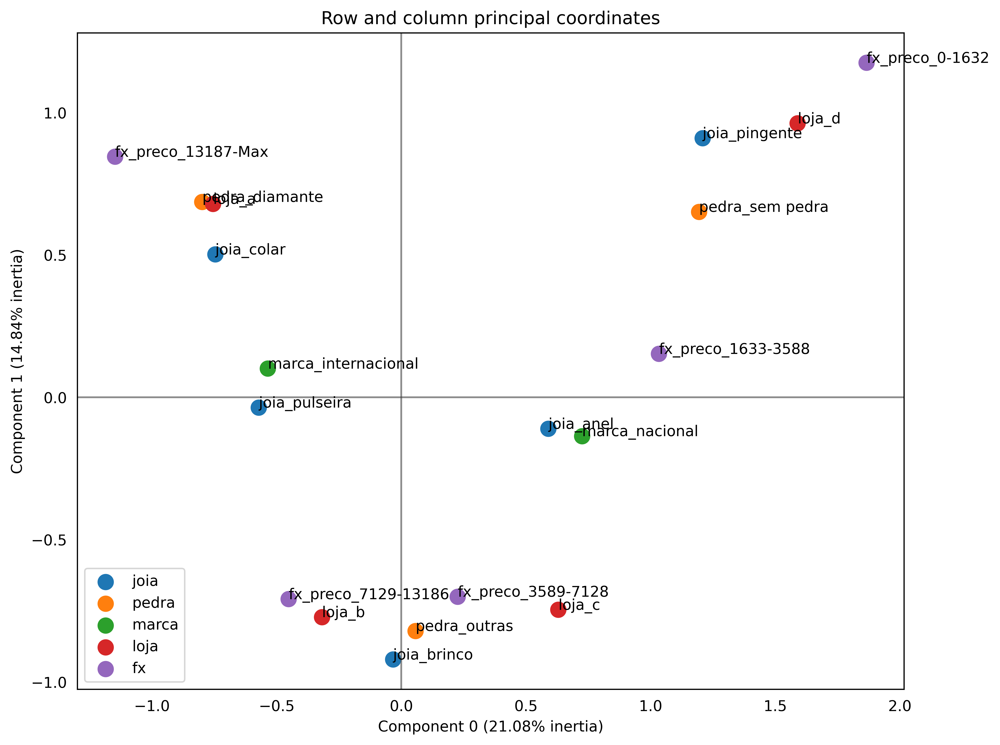

In [15]:
mca.plot_coordinates(X=df_vendas_acm[mca_cols],
                     figsize=(10,8),
                     show_row_points = False,
                     show_column_points = True,
                     show_row_labels=False,
                     show_column_labels = True,
                     column_points_size = 100).grid(False)

**Análise Preliminar do Mapa Perceptual**

O mapa perceptual gerado a partir das duas primeiras dimensões da ACM, que explicam 35,87% da variância total dos dados, permite identificar as seguintes associações preliminares:

Observa-se uma forte proximidade entre a categoria "joia_pulseira" e a marca "internacional", sugerindo uma associação entre esses perfis.

A categoria de preço "0-1630" está localizada no mesmo quadrante que "joia_pingente" e "pedra_sem pedra", indicando um possível perfil de produto de entrada.

Em oposição, a faixa de preço "13441-25200" se posiciona próxima de "joia_colar" e "pedra_diamante", caracterizando um perfil de produto de maior valor agregado.

A Loja D parece ter uma associação clara com produtos de menor preço e sem pedras, enquanto a Loja A se associa a produtos de maior valor.

**Conclusão da Análise de Correspondência e Próximos Passos**

A Análise de Correspondência Múltipla cumpriu seu objetivo exploratório com sucesso, fornecendo uma compreensão profunda da estrutura de associações entre as características das joias e as lojas. Os principais resultados desta etapa foram:

* **Validação das Associações:** O teste Qui-quadrado confirmou que as relações entre as variáveis não são aleatórias, justificando a aplicação de uma técnica para explorar essas interdependências.

* **Identificação de Perfis:** O mapa perceptual revelou afinidades claras e visualmente interpretáveis. Notavelmente, identificamos um perfil de "produtos de entrada" (preços mais baixos, sem pedras) com forte associação à **Loja D**, e um perfil de "produtos de alto valor" (colares, diamantes, faixas de preço elevadas) mais associado à **Loja A**.

* **Redução de Dimensionalidade:** A técnica condensou a complexidade de 19 categorias em apenas duas dimensões principais, que, juntas, retêm 35.87% da inércia total dos dados e servem como excelentes variáveis-resumo do "perfil" de cada produto.

Contudo, a ACM é uma técnica **descritiva**; ela nos mostra as associações existentes, mas não nos permite **prever** o comportamento de vendas para um novo produto. O próximo passo deste trabalho é utilizar os insights gerados para construir um modelo preditivo que auxilie na decisão de alocação de estoque.

Para isso, as coordenadas de cada joia nas duas dimensões principais da ACM (`acm_dim1` e `acm_dim2`), que quantificam numericamente os perfis identificados, foram incorporadas ao dataset como novas *features*. Essas variáveis sintéticas carregarão a riqueza das associações descobertas para a etapa de modelagem.

Será iniciada a fase de modelagem preditiva com uma **Árvore de Decisão**. A escolha se deve à alta interpretabilidade deste modelo, que fornecerá um conjunto de regras de negócio claras e visuais. Servirá como "baseline" de performance e dará os primeiros "insights" sobre como as variáveis, incluindo os novos perfis da ACM, influenciam a alocação ótima de produtos por loja.

##Preparação dos dados para Análise Preditiva

###Criando os data frames com as Coordenadas da ACM para as análise preditivas

Separa X e Y

In [16]:
X = df_vendas.drop(columns=['loja'])
y = df_vendas['loja']

Split Treino e Teste

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3,
                                                    random_state=42)

###Codificação Ordinal para 'faixa_preco'

In [18]:
ordinal_encoder = OrdinalEncoder(categories=[['0-1632','1633-3588','3589-7128','7129-13186','13187-Max']])

ordinal_encoder.fit(X_train[['fx_preco']])

X_train_ordinal = pd.DataFrame(ordinal_encoder.transform(X_train[features_ordinais]), columns=['fx_preco'], index=X_train.index, dtype=int)
X_test_ordinal = pd.DataFrame(ordinal_encoder.transform(X_test[features_ordinais]), columns=['fx_preco'], index=X_test.index, dtype=int)

###One-Hot Encoding para as variáveis nominais

In [19]:
one_hot_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False, drop='first', dtype=int)
one_hot_encoder.fit(X_train[features_categoricas]) # Aprende APENAS com o treino

X_train_dummies = pd.DataFrame(one_hot_encoder.transform(X_train[features_categoricas]), columns=one_hot_encoder.get_feature_names_out(), index=X_train.index)
X_test_dummies = pd.DataFrame(one_hot_encoder.transform(X_test[features_categoricas]), columns=one_hot_encoder.get_feature_names_out(), index=X_test.index)

###Montagem final do dataset SEM ACM

In [20]:
X_train_sem_acm = pd.concat([X_train_ordinal, X_train_dummies], axis=1)
X_test_sem_acm = pd.concat([X_test_ordinal, X_test_dummies], axis=1)

print("Shape X_train_sem_acm:", X_train_sem_acm.shape)
print("Head X_train_sem_acm:\n", X_train_sem_acm.head(), "\n")


Shape X_train_sem_acm: (7026, 8)
Head X_train_sem_acm:
       fx_preco  joia_brinco  joia_colar  joia_pingente  joia_pulseira  \
8334         3            0           0              0              1   
9583         3            0           0              0              0   
3038         2            1           0              0              0   
737          2            0           0              0              1   
3187         0            0           0              0              0   

      pedra_outras  pedra_sem pedra  marca_nacional  
8334             1                0               0  
9583             0                0               0  
3038             1                0               0  
737              0                1               0  
3187             0                1               1   



###Preparação do Dataset com ACM

In [21]:
print("--- Gerando Datasets COM ACM ---")
# 4.1 Treinar a ACM apenas com as colunas nominais do TREINO
mca = prince.MCA(n_components=2, random_state=42)
mca.fit(X_train[features_categoricas]) # Aprende APENAS com o treino

--- Gerando Datasets COM ACM ---


MCA(random_state=42)

###Transformar ambos os conjuntos para obter as coordenadas

In [22]:
X_train_coords = mca.transform(X_train[features_categoricas])
X_test_coords = mca.transform(X_test[features_categoricas])
X_train_coords.columns = ['acm_dim1', 'acm_dim2']
X_test_coords.columns = ['acm_dim1', 'acm_dim2']
X_train_coords.index = X_train.index
X_test_coords.index = X_test.index

###Montagem final do dataset COM ACM (substituindo as categóricas pelas coordenadas)

In [23]:
X_train_com_acm = pd.concat([X_train_ordinal,  X_train_coords], axis=1)
X_test_com_acm = pd.concat([X_test_ordinal, X_test_coords], axis=1)

print("Shape X_train_com_acm:", X_train_com_acm.shape)
print("Head X_train_com_acm:\n", X_train_com_acm.head())

Shape X_train_com_acm: (7026, 3)
Head X_train_com_acm:
       fx_preco  acm_dim1  acm_dim2
8334         3 -0.501329  0.445464
9583         3 -0.333334 -0.408918
3038         2 -0.178649  1.163587
737          2 -0.024538 -0.467185
3187         0  1.269906 -0.549302


#Regressão Logística Multinomial - RLM

## Modelo estatístico explicativo

Antes de partir para análise preditiva, vamos executar uma modelagem estatística explicativa, semelhante à da ACM, porém não será incluído nas discussões do TCC

Criando uma variável 'loja_rlm' a partir da feature 'loja', com labels iguais a 0, 1, 2 e 3, com tipo 'int' (poderia também ser do tipo 'float'), a fim de que seja possível estimar o modelo por meio da função 'MNLogit' do pacote 'statsmodels.discrete.discrete_model'

###Estimação do modelo logístico multinomial

In [31]:
# Adicione a constante ao conjunto de treino para o fitting.
# O novo DataFrame terá o mesmo índice que o original.
X_train_para_fit = sm.add_constant(X_train_sem_acm)

# Estime o modelo usando os dados com a constante.
# endog = variável dependente (y), exog = variáveis independentes (X)
modelo_venda = MNLogit(endog=y_train, exog=X_train_para_fit).fit()

# Exiba o sumário para análise (como você já fez).
print(modelo_venda.summary())

Optimization terminated successfully.
         Current function value: 0.882992
         Iterations 7
                          MNLogit Regression Results                          
Dep. Variable:                   loja   No. Observations:                 7026
Model:                        MNLogit   Df Residuals:                     6999
Method:                           MLE   Df Model:                           24
Date:                Sun, 21 Sep 2025   Pseudo R-squ.:                  0.3380
Time:                        13:11:11   Log-Likelihood:                -6203.9
converged:                       True   LL-Null:                       -9371.3
Covariance Type:            nonrobust   LLR p-value:                     0.000
         loja=b       coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -2.8532      0.330     -8.645      0.000      -3.500      -2.206
fx_preco      

###Calculando o qui-quadrado do modelo

In [32]:
Qui2(modelo_venda)

,Qui quadrado,pvalue
0,6334.716444,0.0


###Gráfico de efeito marginal - Probabilidade Predita

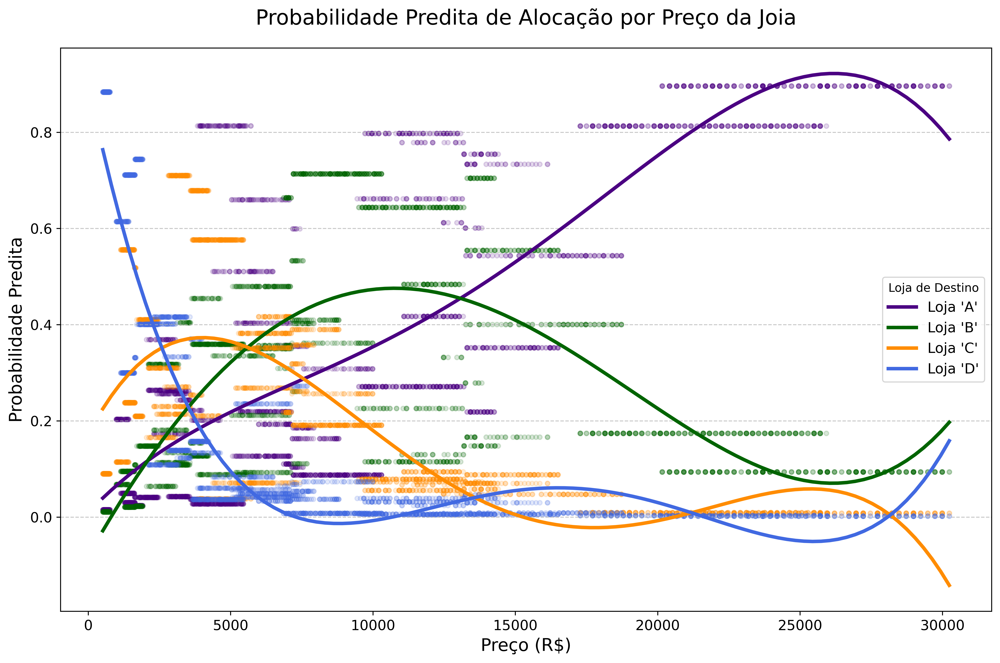

In [33]:
# Adicionar a constante ao X_test_sem_acm para a predição
X_test_para_predict = sm.add_constant(X_test_sem_acm, has_constant='add')
phats_test = modelo_venda.predict(X_test_para_predict)
phats_test.columns = ['prob_a', 'prob_b', 'prob_c', 'prob_d']

# --- 2. CONSTRUÇÃO DO DATAFRAME PARA PLOTAGEM (AQUI ESTÁ O AJUSTE) ---
# Juntamos a coluna 'preco' do X_test ORIGINAL com as probabilidades
# É crucial buscar a variável contínua original para o eixo X do gráfico
df_para_plot = pd.concat([
    X_test['preco'].reset_index(drop=True), # <-- MUDANÇA PRINCIPAL AQUI
    phats_test.reset_index(drop=True)
], axis=1)


# --- 3. CÓDIGO DE PLOTAGEM (AJUSTADO PARA USAR 'preco') ---
plt.figure(figsize=(12, 8))

lojas = {
    'a': {'cor': 'indigo', 'prob_col': 'prob_a'},
    'b': {'cor': 'darkgreen', 'prob_col': 'prob_b'},
    'c': {'cor': 'darkorange', 'prob_col': 'prob_c'},
    'd': {'cor': 'royalblue', 'prob_col': 'prob_d'}
}

for loja, config in lojas.items():
    sns.regplot(x='preco',
                y=config['prob_col'],
                data=df_para_plot,
                ci=False,
                order=4,
                line_kws={'color': config['cor'], 'linewidth': 3, 'label': f"Loja '{loja.upper()}'"},
                scatter_kws={'color': config['cor'], 's': 15, 'alpha': 0.15}
               )

# Customização final do gráfico
plt.title('Probabilidade Predita de Alocação por Preço da Joia', fontsize=18, pad=20)
plt.xlabel('Preço (R$)', fontsize=15)
plt.ylabel('Probabilidade Predita', fontsize=15)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='best', fontsize=12, title='Loja de Destino')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

##Modelo Preditivo

In [34]:
# O DataFrame 'phats_train' terá o mesmo índice que 'X_train_para_fit'.
phats_train = modelo_venda.predict(X_train_para_fit)

# 'phats_train' será um DataFrame com uma coluna de probabilidade para cada loja.
# Ex: colunas 0, 1, 2, 3 representando a probabilidade de ser loja 'a', 'b', 'c', 'd'.

# Crie uma cópia do seu DataFrame de features original para trabalhar.
X_train_com_previsoes = X_train_sem_acm.copy()

# Atribua as probabilidades previstas como novas colunas.
# O pandas alinhará as linhas automaticamente pelo índice.
# Renomeando as colunas de phats para maior clareza.
phats_train.columns = ['a', 'b', 'c', 'd']
X_train_com_previsoes = pd.concat([X_train_com_previsoes, phats_train], axis=1)

# Adicione a previsão final (a classe com a maior probabilidade).
X_train_com_previsoes['predicao_final'] = phats_train.idxmax(axis=1)


print("\n--- Verificação dos Shapes ---")
print(f"Shape original de X_train_sem_acm: {X_train_sem_acm.shape}")
print(f"Shape de phats_train (previsões): {phats_train.shape}")
print(f"Shape final de X_train_com_previsoes: {X_train_com_previsoes.shape}")
print(f"\nNúmero de linhas final: {len(X_train_com_previsoes)}")



--- Verificação dos Shapes ---
Shape original de X_train_sem_acm: (7026, 8)
Shape de phats_train (previsões): (7026, 4)
Shape final de X_train_com_previsoes: (7026, 13)

Número de linhas final: 7026


###Matriz de Confusão da RLM - Treino

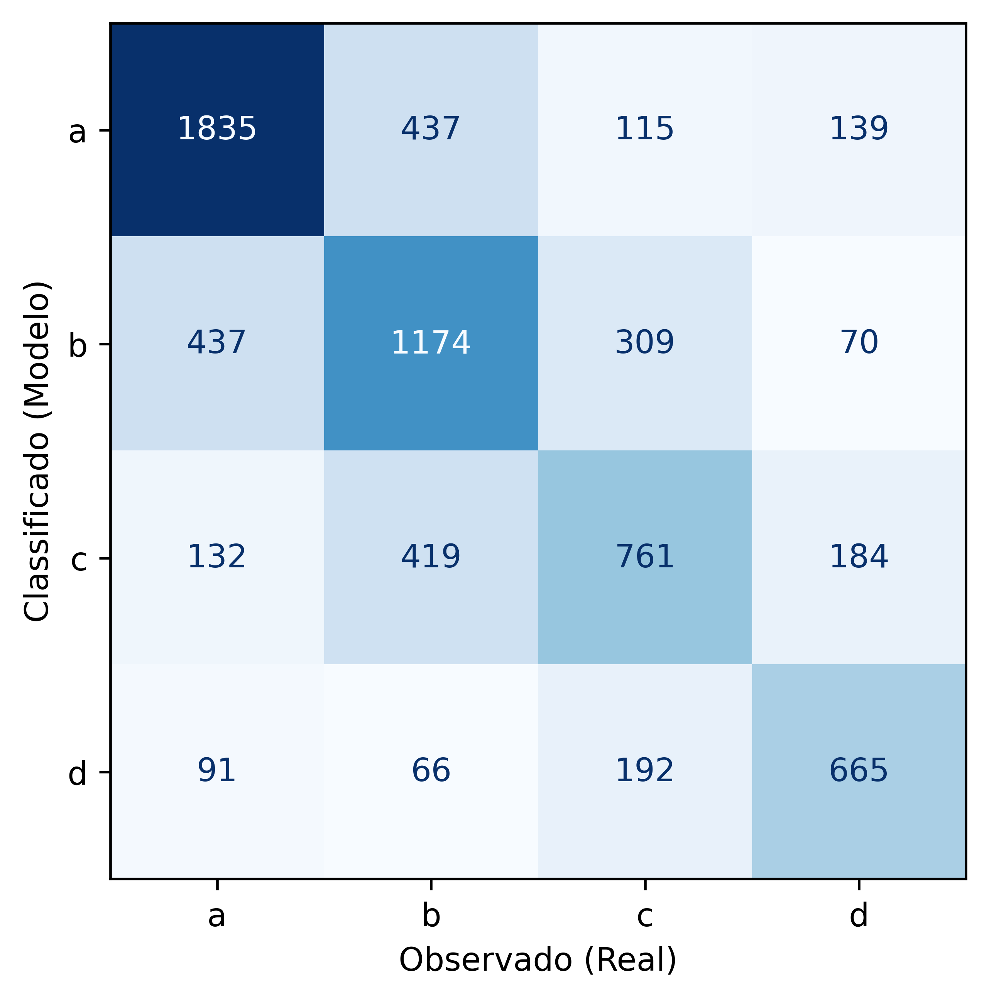


Avaliação da Regressão Logística Multinomial (Base de Treino)
Acurácia: 63.1%
Sensibilidade (Recall Ponderado): 63.1%
Especificidade (Média): 87.3%
Precisão (Ponderada): 63.1%
F1-Score Ponderado: 63.1%


In [35]:
# --- AVALIAÇÃO NO CONJUNTO DE TREINO ---

# Previsões nos dados de treino
predicoes_rlm_treino_prob = modelo_venda.predict(X_train_para_fit)
y_pred_rlm_treino_num = predicoes_rlm_treino_prob.idxmax(axis=1)

mapa_reverso = {
    0: 'a',
    1: 'b',
    2: 'c',
    3: 'd'
}

y_pred_rlm_treino = y_pred_rlm_treino_num.map(mapa_reverso)

# Matriz de Confusão do Treino
rlm_cm_train = confusion_matrix(y_train, y_pred_rlm_treino)
labels = sorted(y_train.unique())
cm_disp_rlm_train = ConfusionMatrixDisplay(confusion_matrix=rlm_cm_train, display_labels=['a', 'b', 'c', 'd'])

cm_disp_rlm_train.plot(colorbar=False, cmap='Blues')
#plt.title('Regressão Logística Multinomial: Treino')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.savefig('matriz_confusao_rlm_treino.png', bbox_inches='tight')
plt.show()

# --- Cálculo das Métricas ---
acc_rlm_train = accuracy_score(y_train, y_pred_rlm_treino)
sens_rlm_train = recall_score(y_train, y_pred_rlm_treino, average='weighted')
prec_rlm_train = precision_score(y_train, y_pred_rlm_treino, average='weighted')
# ADICIONADO: Cálculo do F1-Score Ponderado
f1_rlm_train = f1_score(y_train, y_pred_rlm_treino, average='weighted')

# A especificidade em cenários multiclasse é a média da capacidade do modelo de identificar
# corretamente os negativos para cada classe (abordagem 'one-vs-rest').
espec_rlm_list = []
for label in labels:
    y_true_bin = (y_train == label)
    y_pred_bin = (y_pred_rlm_treino == label)
    if len(confusion_matrix(y_true_bin, y_pred_bin).ravel()) == 4:
        tn, fp, fn, tp = confusion_matrix(y_true_bin, y_pred_bin).ravel()
        especificidade = tn / (tn + fp) if (tn + fp) > 0 else 0
        espec_rlm_list.append(especificidade)

espec_rlm_train = sum(espec_rlm_list) / len(espec_rlm_list) if espec_rlm_list else 0

# --- Exibição dos Resultados ---
print("\nAvaliação da Regressão Logística Multinomial (Base de Treino)")
print(f"Acurácia: {acc_rlm_train:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_rlm_train:.1%}")
print(f"Especificidade (Média): {espec_rlm_train:.1%}")
print(f"Precisão (Ponderada): {prec_rlm_train:.1%}")
# ADICIONADO: Exibição do F1-Score Ponderado
print(f"F1-Score Ponderado: {f1_rlm_train:.1%}")

###Previsões na base de teste

In [36]:
X_test_para_predict = sm.add_constant(X_test_sem_acm)

predicoes_rlm = modelo_venda.predict(X_test_para_predict)

y_pred_rlm = np.argmax(predicoes_rlm, axis=1)


print("Tipo do objeto de predições:", type(predicoes_rlm))
print("Shape do objeto de predições:", predicoes_rlm.shape)
print("\nAs 10 primeiras previsões de classe final:")
print(y_pred_rlm[:10])

Tipo do objeto de predições: <class 'pandas.core.frame.DataFrame'>
Shape do objeto de predições: (3012, 4)

As 10 primeiras previsões de classe final:
[1 1 0 2 3 1 1 0 1 0]


###Matriz de Confusão da RLM - Teste

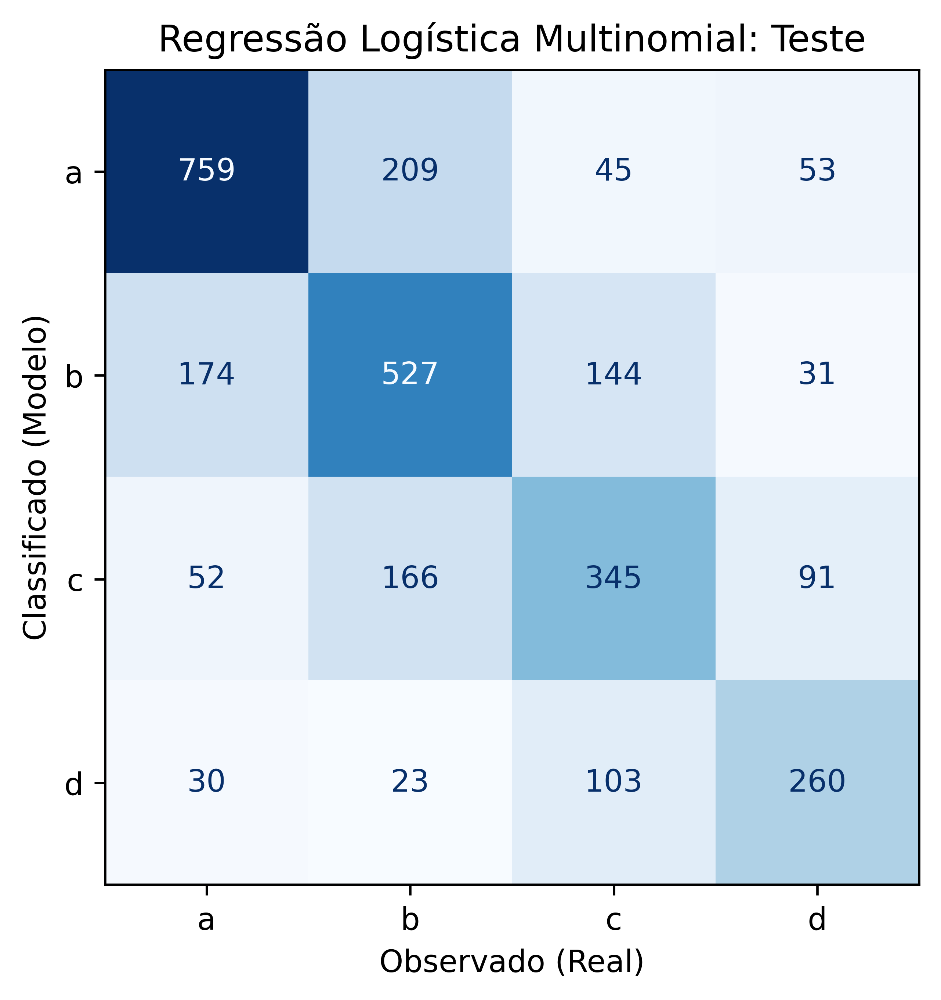


Avaliação da Regressão Logística Multinomial (Base de Teste)
Acurácia: 62.8%
Sensibilidade (Recall Ponderado): 62.8%
Especificidade (Média): 87.3%
Precisão (Ponderada): 63.1%
F1-Score Ponderado: 62.9%

--- Relatório de Classificação Completo ---
              precision    recall  f1-score   support

      Loja a       0.75      0.71      0.73      1066
      Loja b       0.57      0.60      0.59       876
      Loja c       0.54      0.53      0.53       654
      Loja d       0.60      0.62      0.61       416

    accuracy                           0.63      3012
   macro avg       0.61      0.62      0.62      3012
weighted avg       0.63      0.63      0.63      3012



In [37]:
# --- Supondo que você já tenha ---
# y_test: Seus rótulos reais de teste (ex: 'a', 'b', 'c', 'd')
# y_pred_rlm_num: Suas previsões numéricas do teste (ex: 0, 1, 2, 3) vindas do np.argmax

# --- PASSO NOVO: TRADUÇÃO DAS PREVISÕES NUMÉRICAS PARA OS RÓTULOS ORIGINAIS ---
# Crie o mesmo dicionário de mapeamento reverso
mapa_reverso = {
    0: 'a',
    1: 'b',
    2: 'c',
    3: 'd'
}

# Use o .map() para criar a série de previsões com os rótulos de texto corretos
# Primeiro, convertemos o array numpy para uma série pandas para usar o .map()
y_pred_rlm = pd.Series(y_pred_rlm).map(mapa_reverso)


# --- AGORA O RESTANTE DO SEU CÓDIGO FUNCIONA PERFEITAMENTE ---

# Cálculo da Matriz
# Agora y_test e y_pred_rlm ambos usam as letras
labels = ['a', 'b', 'c', 'd'] # Definindo a ordem explicitamente
rlm_cm_test = confusion_matrix(y_test, y_pred_rlm, labels=labels)

# Plotagem
cm_disp_rlm_test = ConfusionMatrixDisplay(confusion_matrix=rlm_cm_test, display_labels=labels)
plt.rcParams['figure.dpi'] = 600
cm_disp_rlm_test.plot(colorbar=False, cmap='Blues')
plt.title('Regressão Logística Multinomial: Teste')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_rlm_test = accuracy_score(y_test, y_pred_rlm)
sens_rlm_test = recall_score(y_test, y_pred_rlm, average='weighted')
prec_rlm_test = precision_score(y_test, y_pred_rlm, average='weighted')
f1_rlm_test = f1_score(y_test, y_pred_rlm, average='weighted')

# A especificidade em cenários multiclasse
espec_rlm_list = []
for label in labels:
    y_true_bin = (y_test == label)
    y_pred_bin = (y_pred_rlm == label)
    if len(confusion_matrix(y_true_bin, y_pred_bin).ravel()) == 4:
        tn, fp, fn, tp = confusion_matrix(y_true_bin, y_pred_bin).ravel()
        especificidade = tn / (tn + fp) if (tn + fp) > 0 else 0
        espec_rlm_list.append(especificidade)

espec_rlm_test = sum(espec_rlm_list) / len(espec_rlm_list) if espec_rlm_list else 0

# --- Exibição do Resumo de Métricas ---
print("\nAvaliação da Regressão Logística Multinomial (Base de Teste)")
print(f"Acurácia: {acc_rlm_test:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_rlm_test:.1%}")
print(f"Especificidade (Média): {espec_rlm_test:.1%}")
print(f"Precisão (Ponderada): {prec_rlm_test:.1%}")
print(f"F1-Score Ponderado: {f1_rlm_test:.1%}")

# --- Relatório Completo por Classe ---
print("\n--- Relatório de Classificação Completo ---")
print(classification_report(y_test, y_pred_rlm, target_names=['Loja a', 'Loja b', 'Loja c', 'Loja d']))

#Árvore de Decisão

##Utilizando as coordenadas da ACM

###Instanciando a árvore

In [38]:
tree_clf = DecisionTreeClassifier(max_depth=4, random_state=42)
tree_clf.fit(X_train_com_acm, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

### Plotando a árvore, profundidade 4

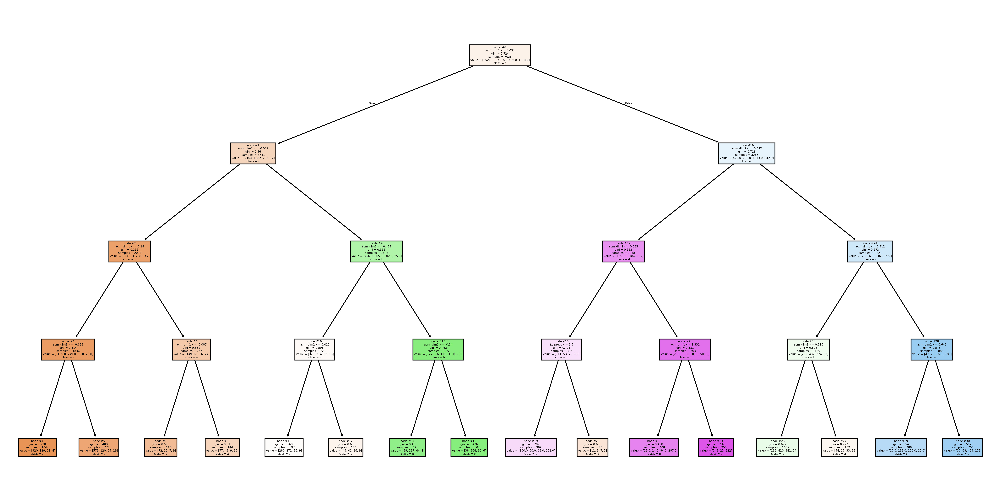

In [39]:
plt.figure(figsize=(20,10), dpi=600)
plot_tree(tree_clf,
          feature_names=X_train_com_acm.columns.tolist(),
          class_names=['a','b','c','d'],
          proportion=False,
          filled=True,
          node_ids=True)
plt.show()

###Analisando os resultados dos splits

In [40]:
tree_split = pd.DataFrame(tree_clf.cost_complexity_pruning_path(X_train_com_acm, y_train))
tree_split.sort_index(ascending=False, inplace=True)

print(tree_split)

    ccp_alphas  impurities
15    0.090182    0.724358
14    0.059884    0.634176
13    0.039381    0.574292
12    0.011827    0.534911
11    0.010292    0.523084
10    0.007342    0.512792
9     0.003838    0.505449
8     0.002761    0.501612
7     0.002564    0.498851
6     0.001166    0.496287
5     0.000925    0.495122
4     0.000902    0.494196
3     0.000679    0.493294
2     0.000269    0.492615
1     0.000154    0.492346
0     0.000000    0.492192


###Importância das variáveis

In [41]:
tree_features = pd.DataFrame({'features':X_train_com_acm.columns.tolist(),
                              'importance':tree_clf.feature_importances_})

print(tree_features)

   features  importance
0  fx_preco    0.001158
1  acm_dim1    0.524023
2  acm_dim2    0.474818


###Obtendo os valores preditos pela árvore

In [42]:
# Predict na base de treinamento
tree_pred_train_class = tree_clf.predict(X_train_com_acm)
tree_pred_train_prob = tree_clf.predict_proba(X_train_com_acm)

# Predict na base de testes
tree_pred_test_class = tree_clf.predict(X_test_com_acm)
tree_pred_test_prob = tree_clf.predict_proba(X_test_com_acm)

###Matriz de confusão da Árvore com ACM (Treino)

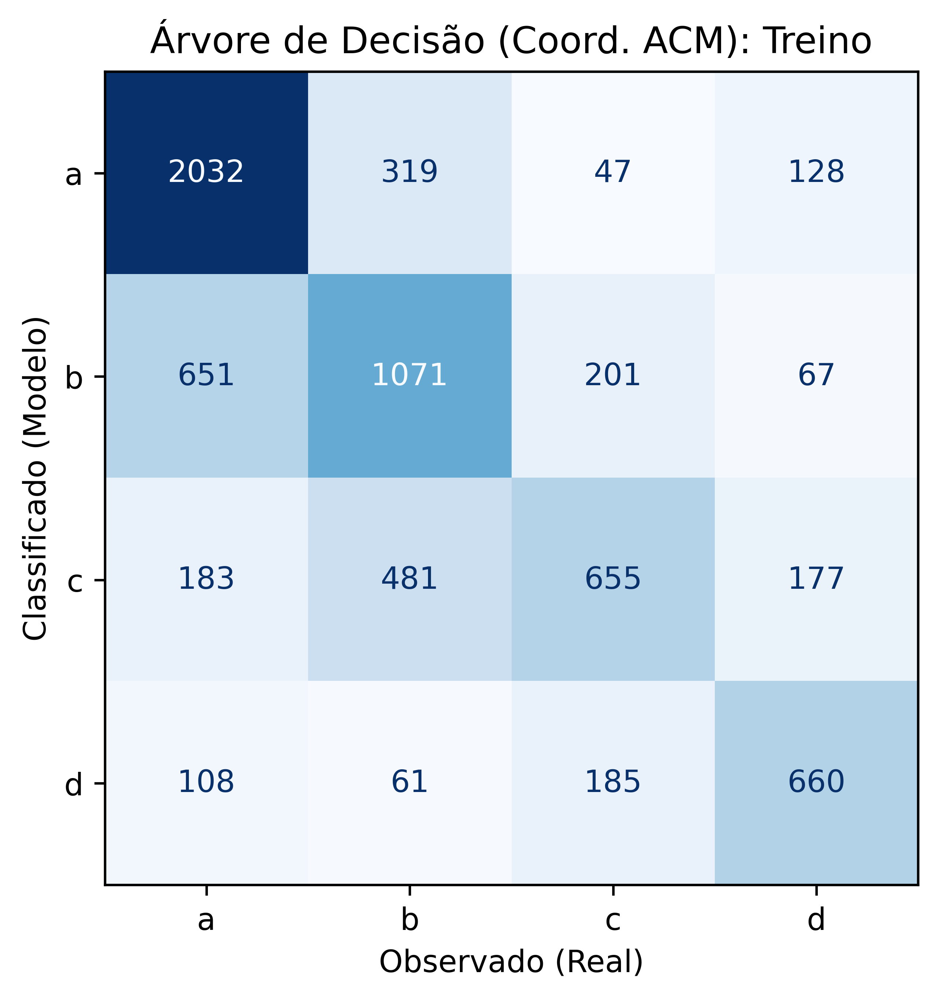

Avaliação da Árvore (Base de Treino)
Acurácia: 62.9%
Sensibilidade (Recall Ponderado): 62.9%
Especificidade: 62.9%
Precisão Ponderada: 62.3%
F1-Score Ponderado: 62.1%


In [43]:
# --- Plotagem da Matriz de Confusão (com correção na ordem dos argumentos) ---
tree_cm_train = confusion_matrix(y_train, tree_pred_train_class) # Ordem padrão: (valores_reais, valores_previstos)
cm_train_disp_tree = ConfusionMatrixDisplay(tree_cm_train, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_train_disp_tree.plot(colorbar=False, cmap='Blues')
plt.title('Árvore de Decisão (Coord. ACM): Treino')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_tree_train = accuracy_score(y_train, tree_pred_train_class)
sens_tree_train = recall_score(y_train, tree_pred_train_class, average='weighted')
espec_tree_train = recall_score(y_train, tree_pred_train_class, pos_label=0, average='weighted')
prec_tree_train = precision_score(y_train, tree_pred_train_class, average='weighted')
f1_tree_train = f1_score(y_train, tree_pred_train_class, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da Árvore (Base de Treino)")
print(f"Acurácia: {acc_tree_train:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_tree_train:.1%}")
print(f"Especificidade: {espec_tree_train:.1%}")
print(f"Precisão Ponderada: {prec_tree_train:.1%}")
print(f"F1-Score Ponderado: {f1_tree_train:.1%}")

###Matriz de confusão da Árvore com ACM (Teste)

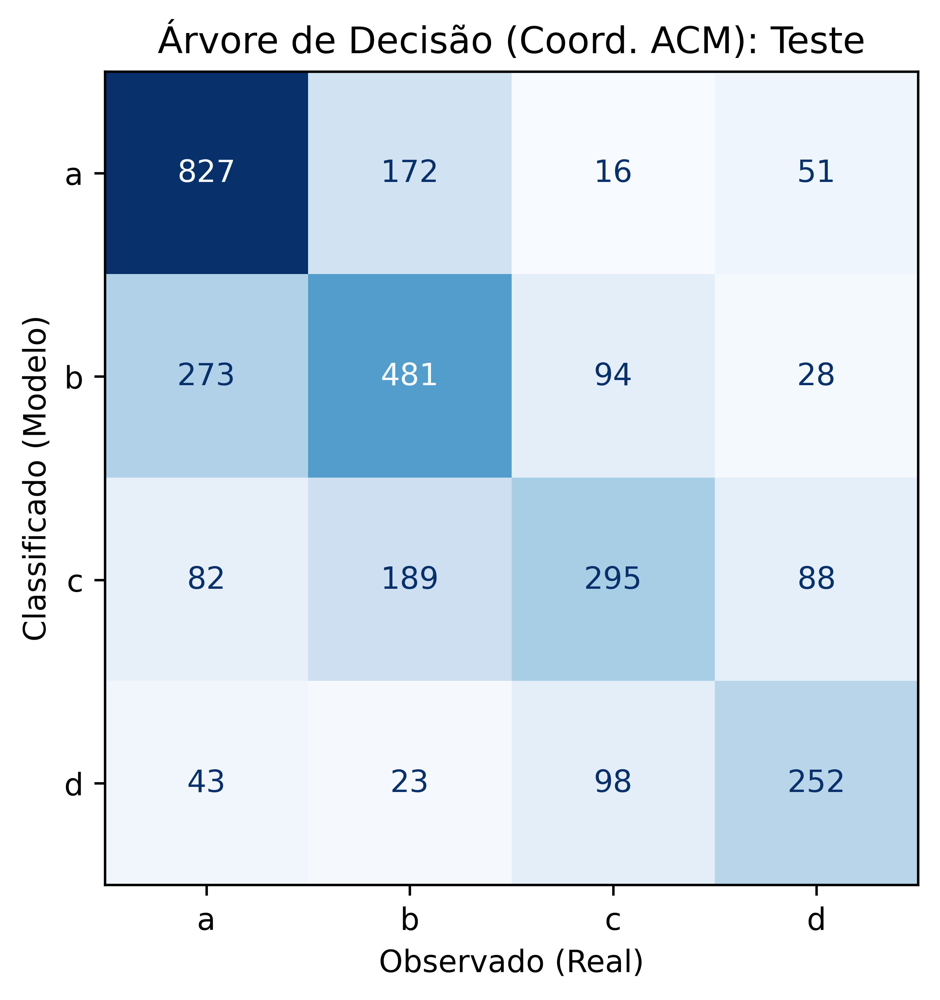

Avaliação da Árvore (Base de Teste)
Acurácia: 61.6%
Sensibilidade (Recall Ponderado): 61.6%
Especificidade: 61.6%
Precisão Ponderada: 61.1%
F1-Score Ponderado: 61.0%


In [44]:
# --- Plotagem da Matriz de Confusão (com correção na ordem dos argumentos) ---
tree_cm_test = confusion_matrix(y_test, tree_pred_test_class) # Ordem padrão: (valores_reais, valores_previstos)
cm_test_disp_tree = ConfusionMatrixDisplay(tree_cm_test, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_test_disp_tree.plot(colorbar=False, cmap='Blues')
plt.title('Árvore de Decisão (Coord. ACM): Teste')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_tree_test = accuracy_score(y_test, tree_pred_test_class)
sens_tree_test = recall_score(y_test, tree_pred_test_class, average='weighted')
espec_tree_test = recall_score(y_test, tree_pred_test_class, pos_label=0, average='weighted')
prec_tree_test = precision_score(y_test, tree_pred_test_class, average='weighted')
f1_tree_test = f1_score(y_test, tree_pred_test_class, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da Árvore (Base de Teste)")
print(f"Acurácia: {acc_tree_test:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_tree_test:.1%}")
print(f"Especificidade: {espec_tree_test:.1%}")
print(f"Precisão Ponderada: {prec_tree_test:.1%}")
print(f"F1-Score Ponderado: {f1_tree_test:.1%}")

###Ajustando os hiperparâmetros do modelo

In [45]:
# max_depth: profundidade máxima da árvore
# min_samples_split: qtde mínima de observações exigidas para dividir o nó
# min_samples_leaf: qtde mínima de observações exigidas para ser nó folha

tree_clf_aj = DecisionTreeClassifier(max_depth=8,
                                     min_samples_split=100,
                                     min_samples_leaf=20,
                                     random_state=42)
tree_clf_aj.fit(X_train_com_acm, y_train)

DecisionTreeClassifier(max_depth=8, min_samples_leaf=20, min_samples_split=100,
                       random_state=42)

###Árvore ajustada

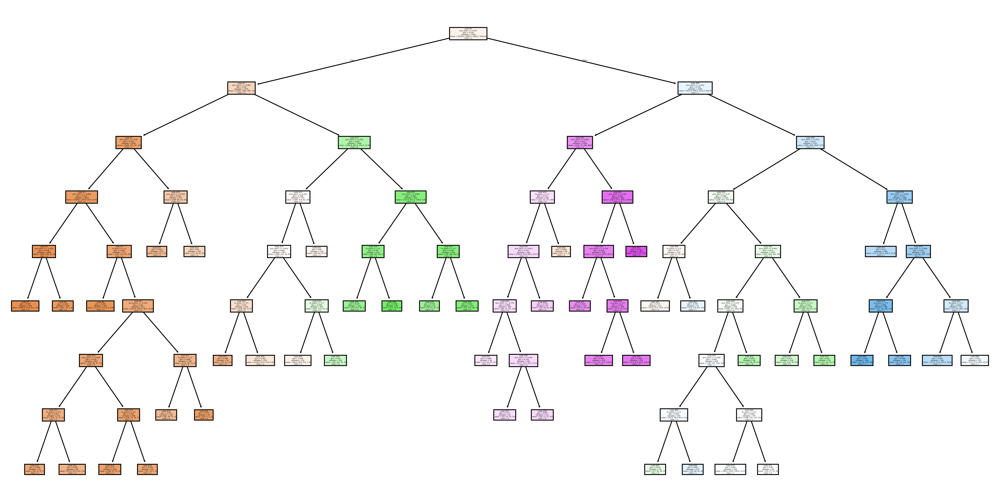

In [46]:
plt.figure(figsize=(20,10), dpi=600)
plot_tree(tree_clf_aj,
          feature_names=X_train_com_acm.columns.tolist(),
          class_names=['a','b','c','d'],
          proportion=False,
          filled=True,
          node_ids=True)
plt.show()

###Obtendo os valores preditos pelo modelo ajustado (base de teste)

In [47]:
tree_pred_test_class_aj = tree_clf_aj.predict(X_test_com_acm)
tree_pred_test_prob_aj = tree_clf_aj.predict_proba(X_test_com_acm)

###Matriz de confusão (Base de teste)

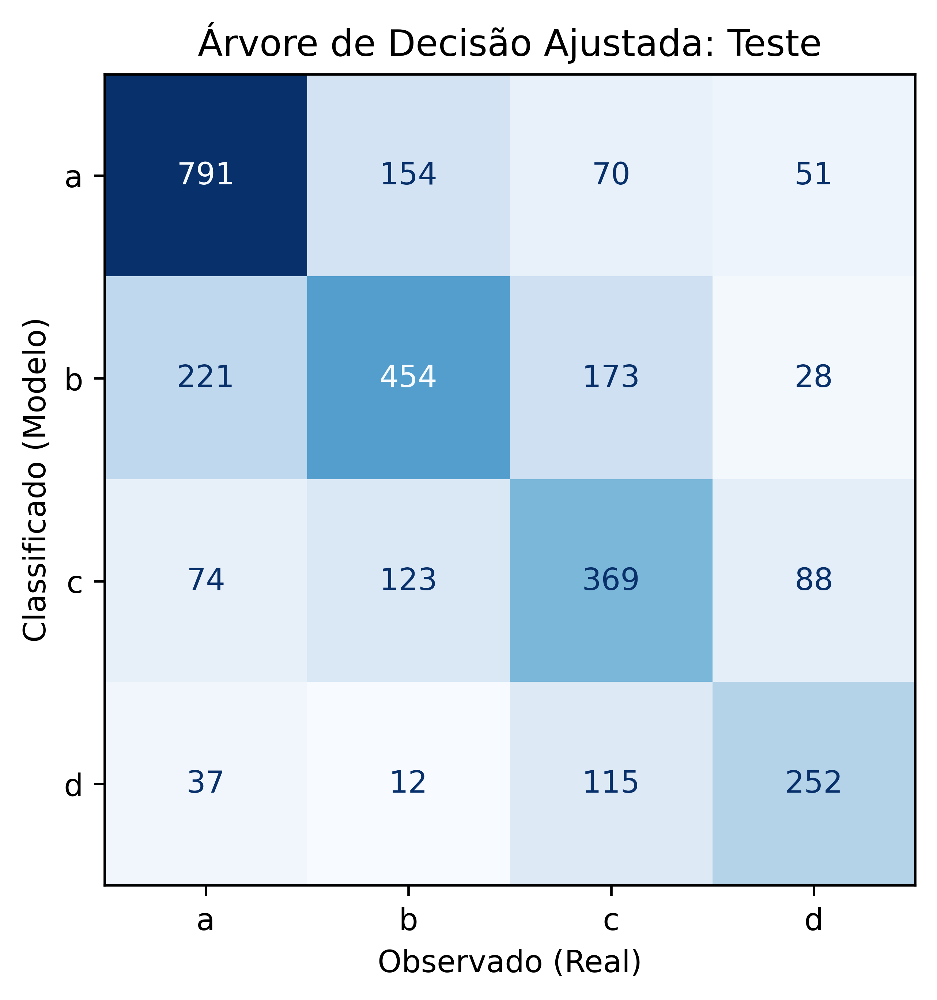

Avaliação da Árvore Ajustada (Base de Teste)
Acurácia: 62.0%
Sensibilidade (Recall Ponderado): 62.0%
Especificidade: 62.0%
Precisão Ponderada: 62.0%
F1-Score Ponderado: 61.8%


In [48]:
# --- Plotagem da Matriz de Confusão ---
tree_cm_test_aj = confusion_matrix(y_test, tree_pred_test_class_aj) # Ordem padrão: (valores_reais, valores_previstos)
cm_test_disp_aj = ConfusionMatrixDisplay(tree_cm_test_aj, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_test_disp_aj.plot(colorbar=False, cmap='Blues')
plt.title('Árvore de Decisão Ajustada: Teste')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_tree_test_aj = accuracy_score(y_test, tree_pred_test_class_aj)
sens_tree_test_aj = recall_score(y_test, tree_pred_test_class_aj, average='weighted')
espec_tree_test_aj = recall_score(y_test, tree_pred_test_class_aj, pos_label=0, average='weighted')
prec_tree_test_aj = precision_score(y_test, tree_pred_test_class_aj, average='weighted')
f1_tree_test_aj = f1_score(y_test, tree_pred_test_class_aj, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da Árvore Ajustada (Base de Teste)")
print(f"Acurácia: {acc_tree_test_aj:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_tree_test_aj:.1%}")
print(f"Especificidade: {espec_tree_test_aj:.1%}")
print(f"Precisão Ponderada: {prec_tree_test_aj:.1%}")
print(f"F1-Score Ponderado: {f1_tree_test_aj:.1%}")

### Parametrizando a função da curva ROC (real vs. previsto)

Testando cada loja vs resto, pois não se trata de y binária

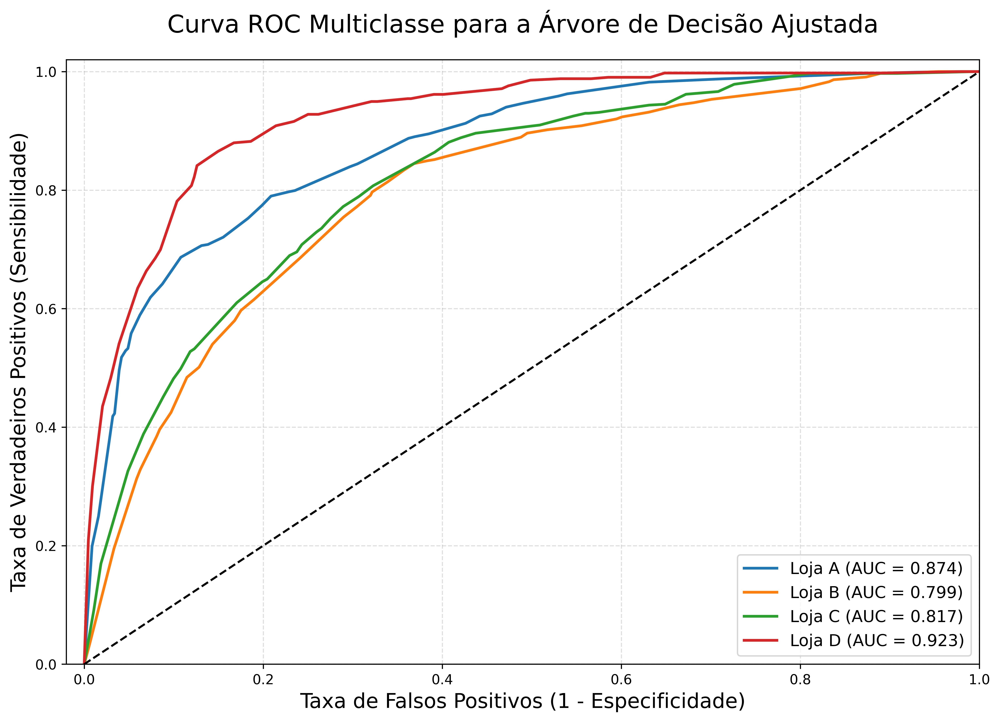

In [49]:
# --- Pré-requisitos (objetos que você já tem em seu notebook) ---
# y_test: seus dados reais (ex: ['a', 'd', 'b', 'a', ...])
# tree_pred_test_prob_aj: as probabilidades previstas pelo seu modelo (deve ter 4 colunas)

# --- Preparação dos Dados ---
classes = sorted(np.unique(y_test))
y_test_bin = label_binarize(y_test, classes=classes)
plot_labels = [f'Loja {c.upper()}' for c in classes]

# --- Plotagem da Curva ROC ---
plt.figure(figsize=(12, 8), dpi=600)

for i in range(y_test_bin.shape[1]):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], tree_pred_test_prob_aj[:, i])
    roc_auc = auc(fpr, tpr)

    # AJUSTE: Reduzindo a espessura da linha para um visual mais clean
    plt.plot(fpr, tpr, lw=2, label=f'{plot_labels[i]} (AUC = {roc_auc:.3f})') # lw (linewidth) ajustado para 2.0

# --- Customização Final ---
plt.plot([0, 1], [0, 1], 'k--', lw=1.5) # Linha de referência também ajustada
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.02])
plt.xlabel('Taxa de Falsos Positivos (1 - Especificidade)', fontsize=15)
plt.ylabel('Taxa de Verdadeiros Positivos (Sensibilidade)', fontsize=15)
plt.title('Curva ROC Multiclasse para a Árvore de Decisão Ajustada', fontsize=18, pad=20)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.4, linestyle='--')
plt.show()

##Sem as coordenadas da ACM

###Plotando a Árvore de Decisão

In [50]:
tree_clf = DecisionTreeClassifier(max_depth=4, random_state=42)
tree_clf.fit(X_train_sem_acm, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

###Plotando a árvore sem ACM

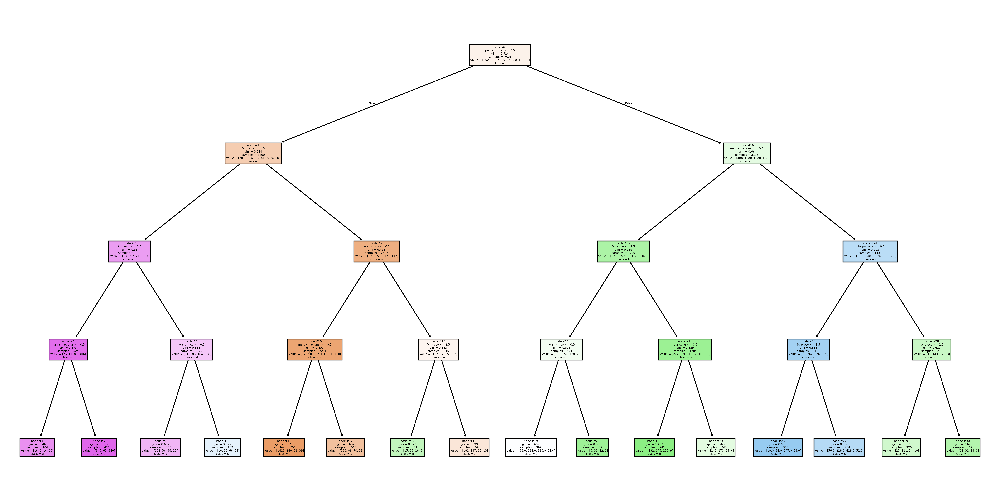

In [51]:
plt.figure(figsize=(20,10), dpi=600)
plot_tree(tree_clf,
          feature_names=X_train_sem_acm.columns.tolist(),
          class_names=['a','b','c','d'],
          proportion=False,
          filled=True,
          node_ids=True)
plt.show()

###Analisando resultado dos splits

In [52]:
tree_split = pd.DataFrame(tree_clf.cost_complexity_pruning_path(X_train_sem_acm, y_train))
tree_split.sort_index(ascending=False, inplace=True)

print(tree_split)

    ccp_alphas  impurities
14    0.077068    0.724358
13    0.025675    0.570222
12    0.008590    0.544547
11    0.005557    0.535956
10    0.005322    0.530400
9     0.004883    0.525078
8     0.004175    0.520194
7     0.003957    0.516020
6     0.002794    0.512062
5     0.001853    0.509269
4     0.001263    0.507416
3     0.000846    0.506153
2     0.000677    0.505307
1     0.000134    0.504630
0     0.000000    0.504496


###Análise da importância das variáveis

In [53]:
tree_features = pd.DataFrame({'features':X_train_sem_acm.columns.tolist(),
                              'importance':tree_clf.feature_importances_})

print(tree_features)

          features  importance
0         fx_preco    0.435498
1      joia_brinco    0.051348
2       joia_colar    0.018988
3    joia_pingente    0.000000
4    joia_pulseira    0.024205
5     pedra_outras    0.332103
6  pedra_sem pedra    0.000000
7   marca_nacional    0.137857


###Obtendo valores preditos pela árvore

In [54]:
# Predict na base de treinamento
tree_pred_train_class = tree_clf.predict(X_train_sem_acm)
tree_pred_train_prob = tree_clf.predict_proba(X_train_sem_acm)

# Predict na base de testes
tree_pred_test_class = tree_clf.predict(X_test_sem_acm)
tree_pred_test_prob = tree_clf.predict_proba(X_test_sem_acm)

###Matriz de confusão da Árvore sem ACM (Treino)

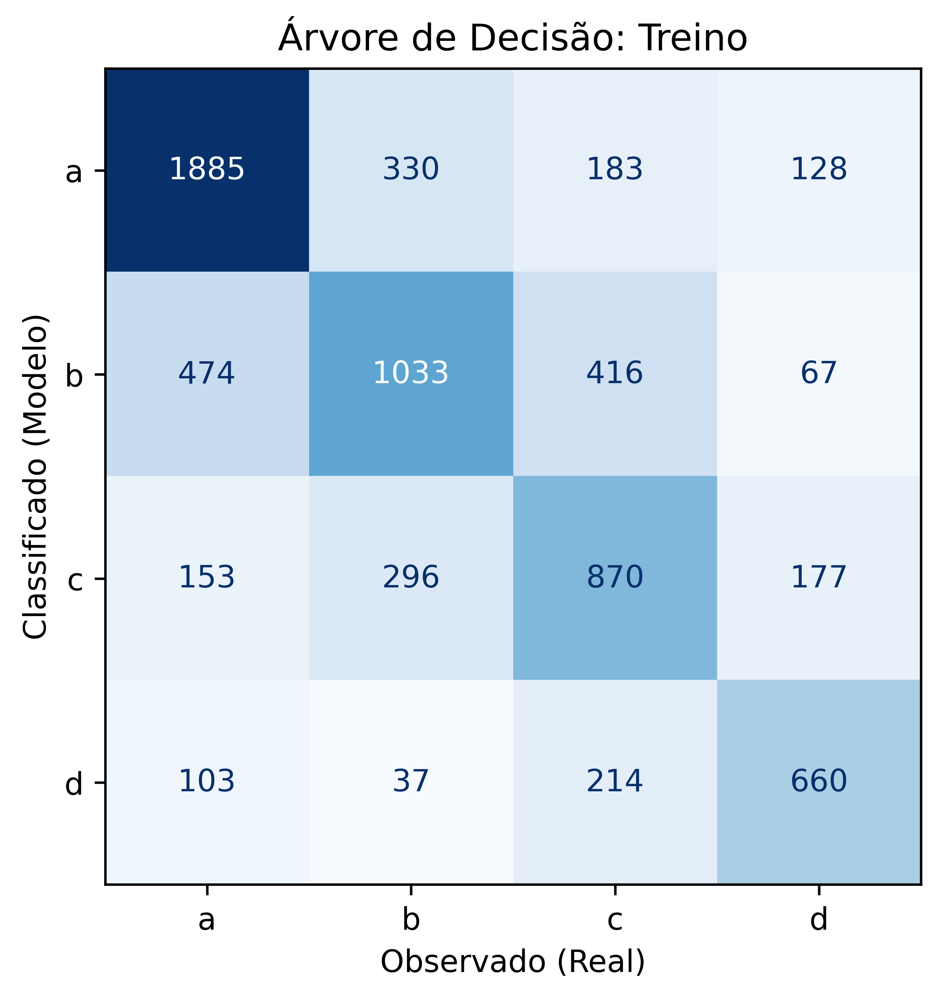

Avaliação da Árvore (Base de Treino)
Acurácia: 63.3%
Sensibilidade (Recall Ponderado): 63.3%
Especificidade: 63.3%
Precisão Ponderada: 63.4%
F1-Score Ponderado: 63.2%


In [55]:
# --- Plotagem da Matriz de Confusão ---
tree_cm_train = confusion_matrix(y_train, tree_pred_train_class) # Ordem padrão: (valores_reais, valores_previstos)
cm_train_disp_tree = ConfusionMatrixDisplay(tree_cm_train, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_train_disp_tree.plot(colorbar=False, cmap='Blues')
plt.title('Árvore de Decisão: Treino')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_tree_train = accuracy_score(y_train, tree_pred_train_class)
sens_tree_train = recall_score(y_train, tree_pred_train_class, average='weighted')
espec_tree_train = recall_score(y_train, tree_pred_train_class, pos_label=0, average='weighted')
prec_tree_train = precision_score(y_train, tree_pred_train_class, average='weighted')
f1_tree_train = f1_score(y_train, tree_pred_train_class, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da Árvore (Base de Treino)")
print(f"Acurácia: {acc_tree_train:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_tree_train:.1%}")
print(f"Especificidade: {espec_tree_train:.1%}")
print(f"Precisão Ponderada: {prec_tree_train:.1%}")
print(f"F1-Score Ponderado: {f1_tree_train:.1%}")

###Matriz de confusão da Árvore sem ACM (Teste)

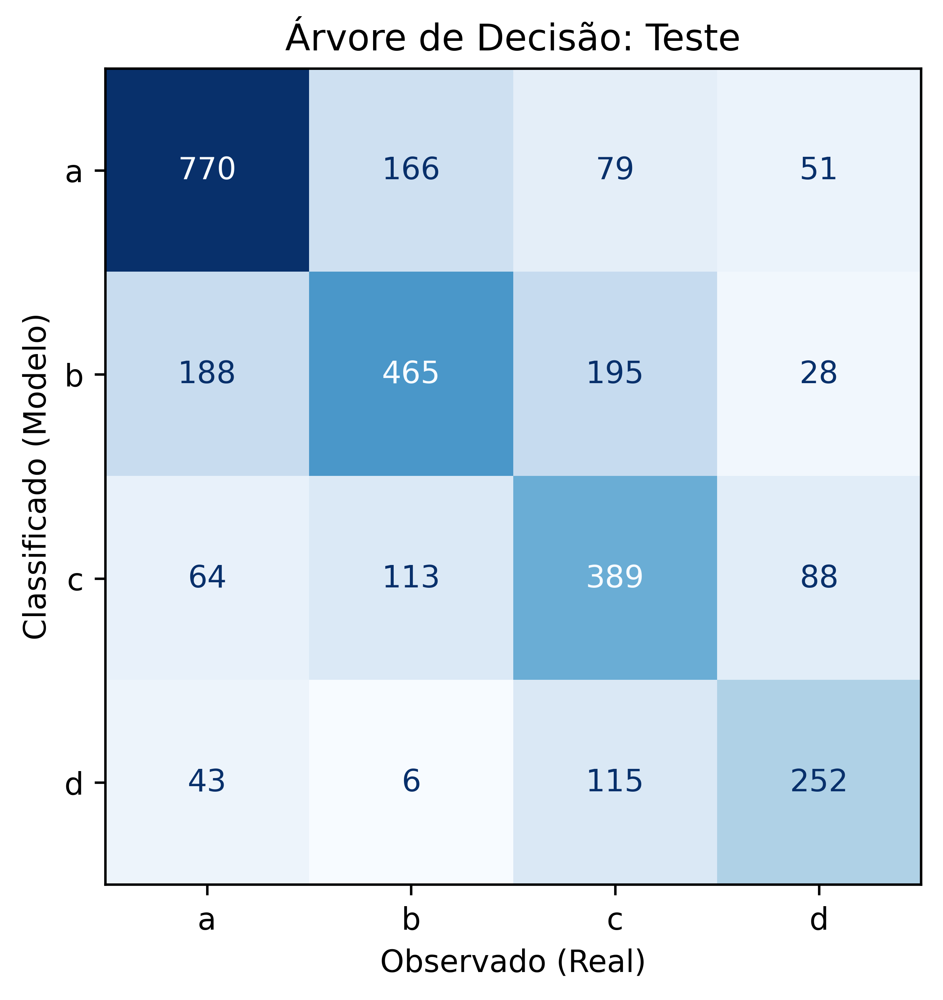

Avaliação da Árvore (Base de Teste)
Acurácia: 62.3%
Sensibilidade (Recall Ponderado): 62.3%
Especificidade: 62.3%
Precisão Ponderada: 62.8%
F1-Score Ponderado: 62.3%


In [56]:
# --- Plotagem da Matriz de Confusão (com correção na ordem dos argumentos) ---
tree_cm_test = confusion_matrix(y_test, tree_pred_test_class) # Ordem padrão: (valores_reais, valores_previstos)
cm_test_disp_tree = ConfusionMatrixDisplay(tree_cm_test, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_test_disp_tree.plot(colorbar=False, cmap='Blues')
plt.title('Árvore de Decisão: Teste')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_tree_test = accuracy_score(y_test, tree_pred_test_class)
sens_tree_test = recall_score(y_test, tree_pred_test_class, average='weighted')
espec_tree_test = recall_score(y_test, tree_pred_test_class, pos_label=0, average='weighted')
prec_tree_test = precision_score(y_test, tree_pred_test_class, average='weighted')
f1_tree_test = f1_score(y_test, tree_pred_test_class, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da Árvore (Base de Teste)")
print(f"Acurácia: {acc_tree_test:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_tree_test:.1%}")
print(f"Especificidade: {espec_tree_test:.1%}")
print(f"Precisão Ponderada: {prec_tree_test:.1%}")
print(f"F1-Score Ponderado: {f1_tree_test:.1%}")

###Ajustando os hiperparâmetros do modelo

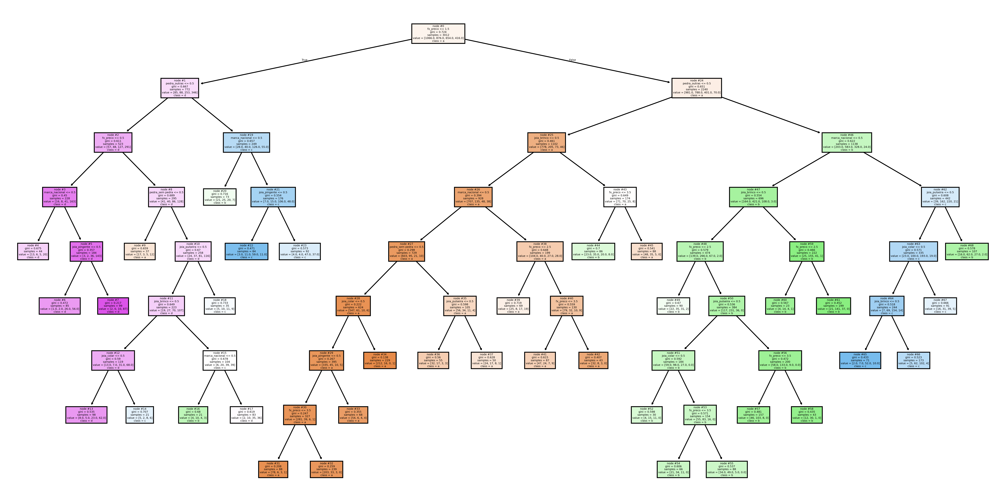

In [57]:
# max_depth: profundidade máxima da árvore
# min_samples_split: qtde mínima de observações exigidas para dividir o nó
# min_samples_leaf: qtde mínima de observações exigidas para ser nó folha

tree_clf_aj = DecisionTreeClassifier(max_depth=8,
                                     min_samples_split=100,
                                     min_samples_leaf=20,
                                     random_state=42)
tree_clf_aj.fit(X_test_sem_acm, y_test)


#Plotando a árvore ajustada
plt.figure(figsize=(20,10), dpi=600)
plot_tree(tree_clf_aj,
          feature_names=X_test_sem_acm.columns.tolist(),
          class_names=['a','b','c','d'],
          proportion=False,
          filled=True,
          node_ids=True)
plt.show()

###Obtendo os valores preditos para a árvore ajustada (hiperparâmetros)

In [58]:
tree_pred_test_class_aj = tree_clf_aj.predict(X_test_sem_acm)
tree_pred_test_prob_aj = tree_clf_aj.predict_proba(X_test_sem_acm)

###Matriz de confusão na base de teste com hiperparâmetros ajustados

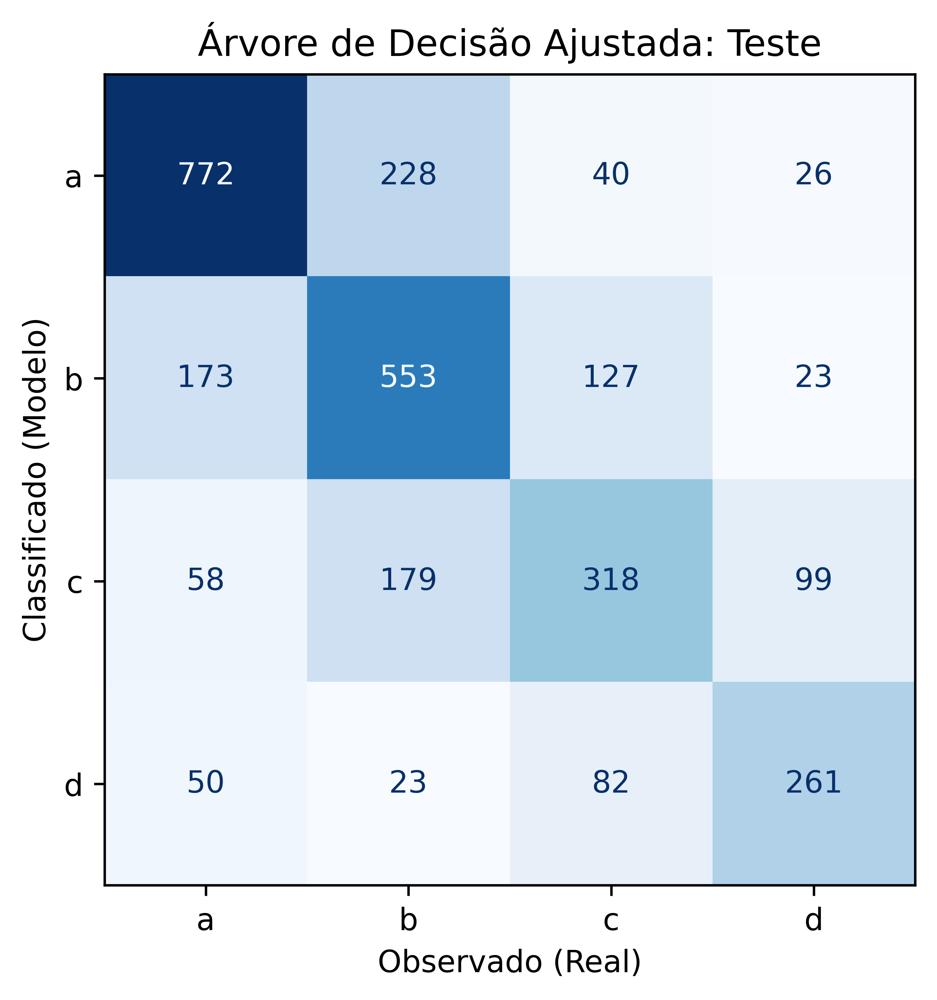

Avaliação da Árvore Ajustada (Base de Teste)
Acurácia: 63.2%
Sensibilidade (Recall Ponderado): 63.2%
Especificidade: 63.2%
Precisão Ponderada: 63.3%
F1-Score Ponderado: 63.1%


In [59]:
# --- Plotagem da Matriz de Confusão ---
tree_cm_test_aj = confusion_matrix(y_test, tree_pred_test_class_aj) # Ordem padrão: (valores_reais, valores_previstos)
cm_test_disp_aj = ConfusionMatrixDisplay(tree_cm_test_aj, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_test_disp_aj.plot(colorbar=False, cmap='Blues')
plt.title('Árvore de Decisão Ajustada: Teste')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_tree_test_aj = accuracy_score(y_test, tree_pred_test_class_aj)
sens_tree_test_aj = recall_score(y_test, tree_pred_test_class_aj, average='weighted')
espec_tree_test_aj = recall_score(y_test, tree_pred_test_class_aj, pos_label=0, average='weighted')
prec_tree_test_aj = precision_score(y_test, tree_pred_test_class_aj, average='weighted')
f1_tree_test_aj = f1_score(y_test, tree_pred_test_class_aj, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da Árvore Ajustada (Base de Teste)")
print(f"Acurácia: {acc_tree_test_aj:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_tree_test_aj:.1%}")
print(f"Especificidade: {espec_tree_test_aj:.1%}")
print(f"Precisão Ponderada: {prec_tree_test_aj:.1%}")
print(f"F1-Score Ponderado: {f1_tree_test_aj:.1%}")

###Parametrizando a função da curva ROC (real vs previsto)

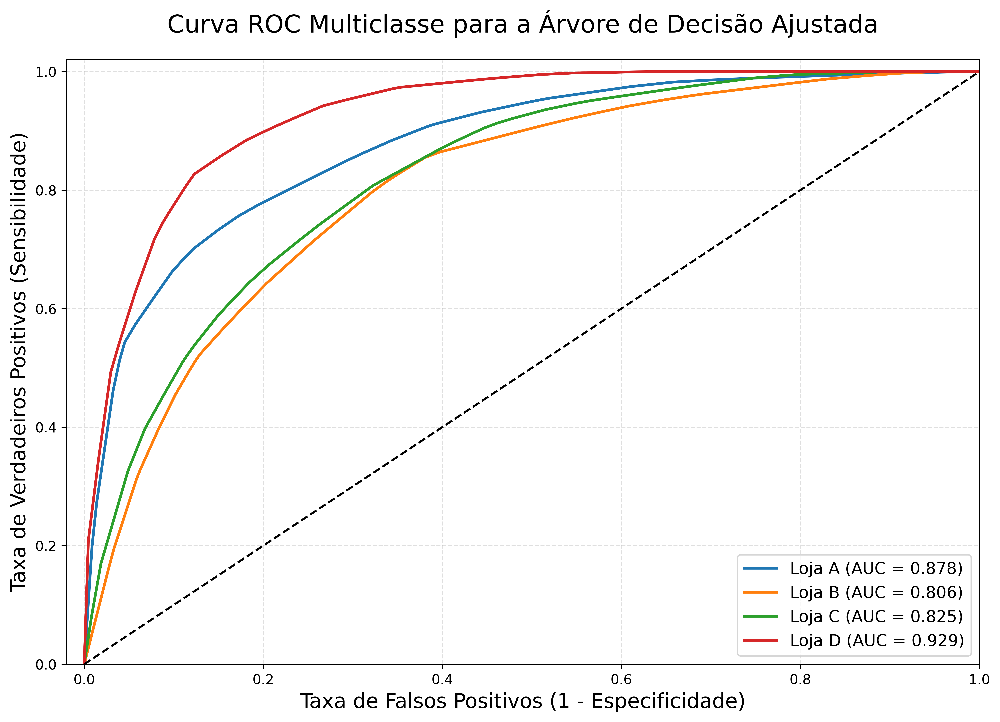

In [60]:
# --- Preparação dos Dados ---
classes = sorted(np.unique(y_test))
y_test_bin = label_binarize(y_test, classes=classes)
plot_labels = [f'Loja {c.upper()}' for c in classes]

# --- Plotagem da Curva ROC ---
plt.figure(figsize=(12, 8), dpi=600)

for i in range(y_test_bin.shape[1]):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], tree_pred_test_prob_aj[:, i])
    roc_auc = auc(fpr, tpr)

    # AJUSTE: Reduzindo a espessura da linha para um visual mais clean
    plt.plot(fpr, tpr, lw=2, label=f'{plot_labels[i]} (AUC = {roc_auc:.3f})') # lw (linewidth) ajustado para 2.0

# --- Customização Final ---
plt.plot([0, 1], [0, 1], 'k--', lw=1.5) # Linha de referência também ajustada
plt.xlim([-0.02, 1.0])
plt.ylim([0.0, 1.02])
plt.xlabel('Taxa de Falsos Positivos (1 - Especificidade)', fontsize=15)
plt.ylabel('Taxa de Verdadeiros Positivos (Sensibilidade)', fontsize=15)
plt.title('Curva ROC Multiclasse para a Árvore de Decisão Ajustada', fontsize=18, pad=20)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.4, linestyle='--')
plt.show()

#Random Forest

##Estimando uma Random Forest

In [61]:
rf_clf = RandomForestClassifier(n_estimators=50,
                                max_depth=4,
                                #max_features=20, #Removi esta configuração para testar
                                random_state=100)
rf_clf.fit(X_train_sem_acm, y_train)

RandomForestClassifier(max_depth=4, n_estimators=50, random_state=100)

### Obtendo os valores preditos pela RF

In [62]:
# Predict na base de treinamento
rf_pred_train_class = rf_clf.predict(X_train_sem_acm)
rf_pred_train_prob = rf_clf.predict_proba(X_train_sem_acm)

# Predict na base de testes
rf_pred_test_class = rf_clf.predict(X_test_sem_acm)
rf_pred_test_prob = rf_clf.predict_proba(X_test_sem_acm)

###Matriz de confusão da Random Forest (Treino)

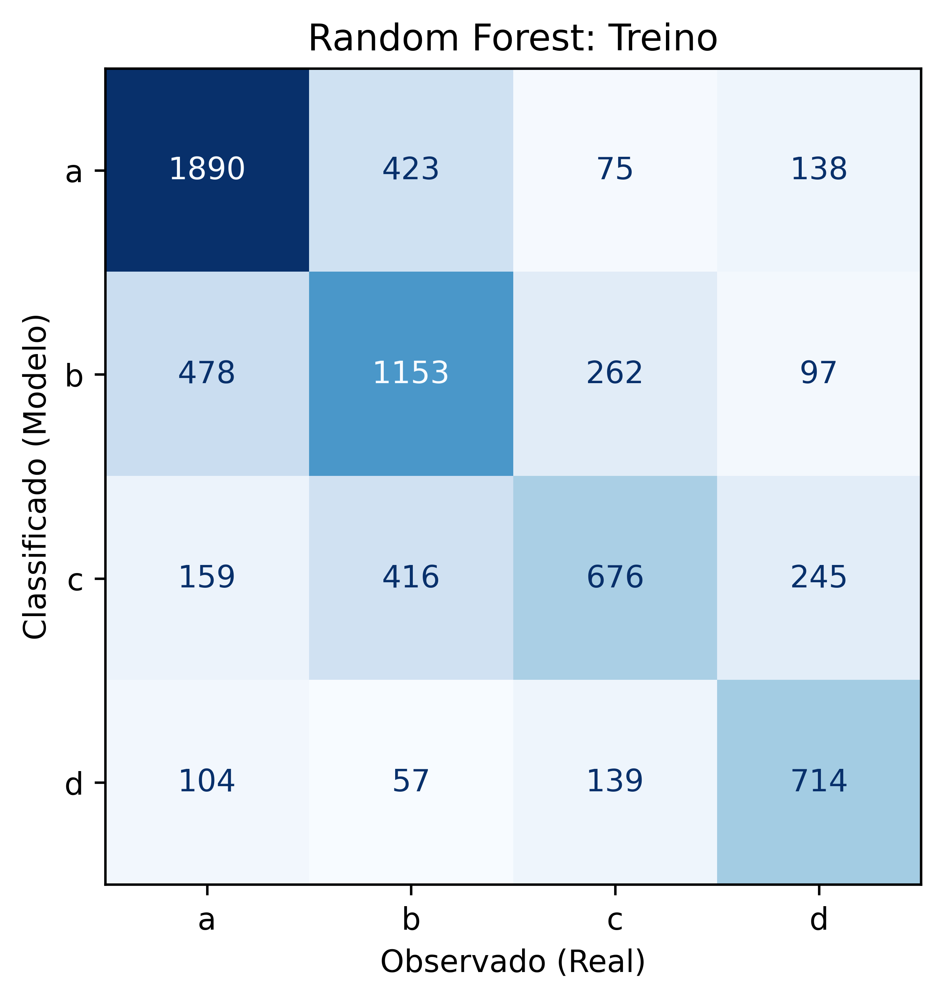

Avaliação da RF (Base de Treino)
Acurácia: 63.1%
Sensibilidade (Recall Ponderado): 63.1%
Especificidade: 63.1%
Precisão Ponderada: 62.9%
F1-Score Ponderado: 62.7%


In [63]:
# --- Plotagem da Matriz de Confusão ---
rf_cm_train = confusion_matrix(y_train, rf_pred_train_class) # Ordem padrão: (valores_reais, valores_previstos)
cm_rf_train = ConfusionMatrixDisplay(rf_cm_train, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_rf_train.plot(colorbar=False, cmap='Blues')
plt.title('Random Forest: Treino')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_rf_train = accuracy_score(y_train, rf_pred_train_class)
sens_rf_train = recall_score(y_train, rf_pred_train_class, average='weighted')
espec_rf_train = recall_score(y_train, rf_pred_train_class, pos_label=0, average='weighted')
prec_rf_train = precision_score(y_train, rf_pred_train_class, average='weighted')
# ADICIONADO: Cálculo do F1-Score Ponderado
f1_rf_train = f1_score(y_train, rf_pred_train_class, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da RF (Base de Treino)")
print(f"Acurácia: {acc_rf_train:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_rf_train:.1%}")
print(f"Especificidade: {espec_rf_train:.1%}")
print(f"Precisão Ponderada: {prec_rf_train:.1%}")
# ADICIONADO: Exibição do F1-Score Ponderado
print(f"F1-Score Ponderado: {f1_rf_train:.1%}")

###Matriz de confusão da Random Forest (Teste)

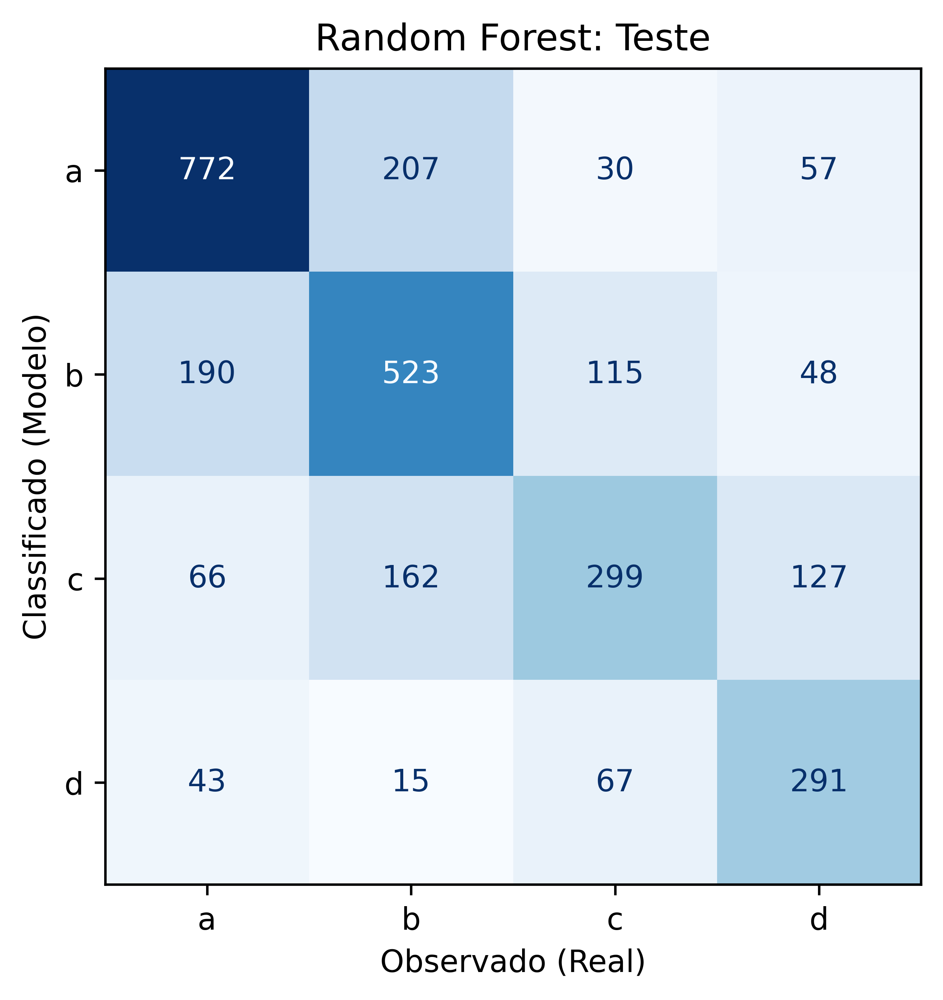

Avaliação da RF (Base de Teste)
Acurácia: 62.6%
Sensibilidade (Recall Ponderado): 62.6%
Especificidade: 62.6%
Precisão Ponderada: 62.7%
F1-Score Ponderado: 62.3%


In [64]:
# --- Plotagem da Matriz de Confusão ---
rf_cm_test = confusion_matrix(y_test, rf_pred_test_class) # Ordem padrão: (valores_reais, valores_previstos)
cm_rf_test = ConfusionMatrixDisplay(rf_cm_test, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_rf_test.plot(colorbar=False, cmap='Blues')
plt.title('Random Forest: Teste')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_rf_test = accuracy_score(y_test, rf_pred_test_class)
sens_rf_test = recall_score(y_test, rf_pred_test_class, average='weighted')
espec_rf_test = recall_score(y_test, rf_pred_test_class, pos_label=0, average='weighted')
prec_rf_test = precision_score(y_test, rf_pred_test_class, average='weighted')
# ADICIONADO: Cálculo do F1-Score Ponderado
f1_rf_test = f1_score(y_test, rf_pred_test_class, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da RF (Base de Teste)")
print(f"Acurácia: {acc_rf_test:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_rf_test:.1%}")
print(f"Especificidade: {espec_rf_test:.1%}")
print(f"Precisão Ponderada: {prec_rf_test:.1%}")
# ADICIONADO: Exibição do F1-Score Ponderado
print(f"F1-Score Ponderado: {f1_rf_test:.1%}")

##Grid Search

In [65]:
# Vamos especificar a lista de hiperparâmetros desejados e seus valores
param_grid_rf = {
    'n_estimators': [10, 50, 500],
    'max_depth': [3, 6, 10],
    'max_features': [3, 6, None],
    #'min_samples_split': [10, 100, 500]
}

# Identificar o algoritmo em uso
rf_grid = RandomForestClassifier(random_state=42)

# Treinar os modelos para o grid search
rf_grid_model = GridSearchCV(estimator = rf_grid,
                             param_grid = param_grid_rf,
                             #scoring='accuracy',
                             scoring='f1_weighted',
                             cv=5, verbose=2)

rf_grid_model.fit(X_train_sem_acm, y_train)

# Verificando os melhores parâmetros obtidos
rf_grid_model.best_params_

# Gerando o modelo com os melhores hiperparâmetros
rf_best = rf_grid_model.best_estimator_

# Predict na base de treino
rf_grid_pred_train_class = rf_best.predict(X_train_sem_acm)
rf_grid_pred_train_prob = rf_best.predict_proba(X_train_sem_acm)

# Predict na base de testes
rf_grid_pred_test_class = rf_best.predict(X_test_sem_acm)
rf_grid_pred_test_prob = rf_best.predict_proba(X_test_sem_acm)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END ......max_depth=3, max_features=3, n_estimators=500; total time=   0.8s
[CV] END ......max_depth=3, max_features=3, n_e

###Matriz de confusão da Random Forest otimizada (Treino)

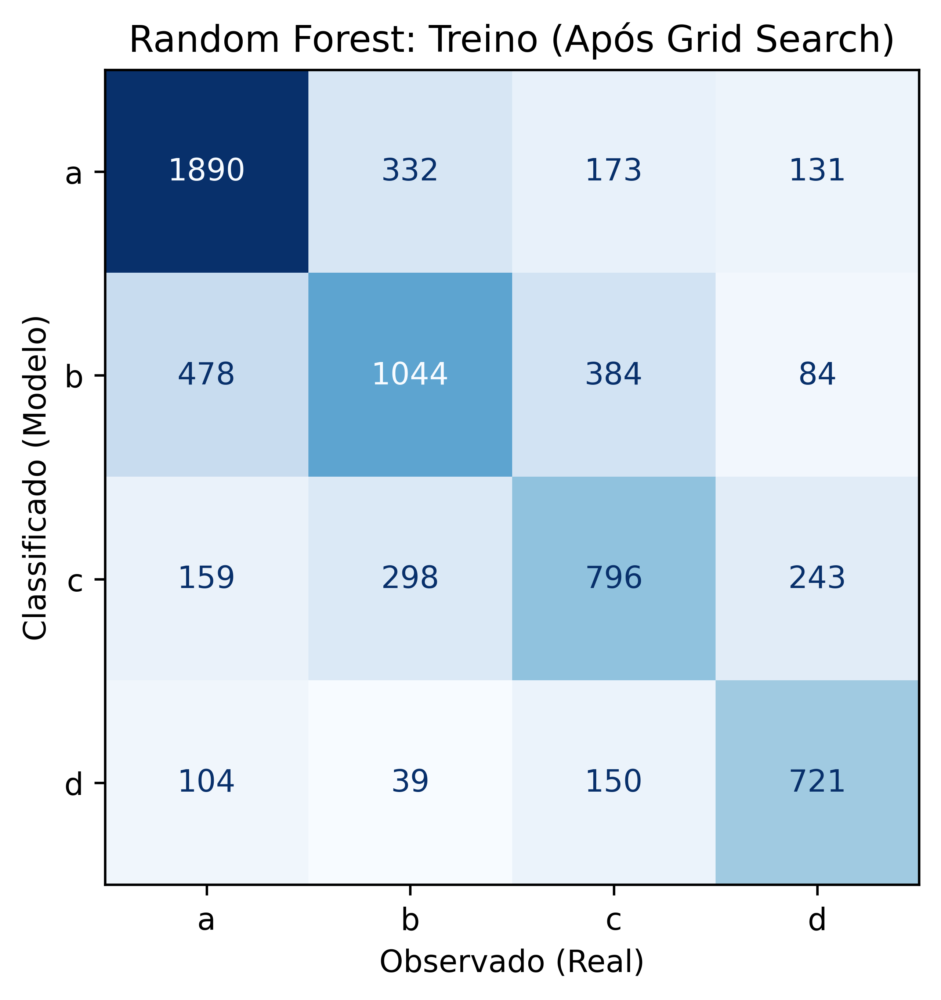

Avaliação da RF Após Grid Search (Base de Treino)
Acurácia: 63.4%
Sensibilidade: 63.4%
Precisão Ponderada: 63.2%
F1-Score Ponderado: 63.1%


In [76]:
# --- 1. Cálculo das Métricas (incluindo o F1-Score) ---
acc_rf_grid_train = accuracy_score(y_train, rf_grid_pred_train_class)
sens_rf_grid_train = recall_score(y_train, rf_grid_pred_train_class, average='weighted')
prec_rf_grid_train = precision_score(y_train, rf_grid_pred_train_class, average='weighted')
# Adicionamos o cálculo do F1-Score ponderado
f1_rf_grid_train = f1_score(y_train, rf_grid_pred_train_class, average='weighted')

# --- 2. Geração da Matriz de Confusão ---
rf_grid_cm_train = confusion_matrix(y_train, rf_grid_pred_train_class) # Correção na ordem dos argumentos
cm_rf_grid_train = ConfusionMatrixDisplay(rf_grid_cm_train, display_labels=['a', 'b', 'c', 'd'])

# --- 3. Plotagem com o Título Dinâmico ---
plt.rcParams['figure.dpi'] = 600
cm_rf_grid_train.plot(colorbar=False, cmap='Blues')

# Modificamos o título para incluir o valor do F1-Score formatado
plt.title(f"Random Forest: Treino (Após Grid Search)")

plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- 4. Exibição de todas as métricas ---
print("Avaliação da RF Após Grid Search (Base de Treino)")
print(f"Acurácia: {acc_rf_grid_train:.1%}")
print(f"Sensibilidade: {sens_rf_grid_train:.1%}")
# A especificidade em multiclasse é complexa, mantemos a sua abordagem por consistência
# espec_rf_grid_train = ...
print(f"Precisão Ponderada: {prec_rf_grid_train:.1%}")
print(f"F1-Score Ponderado: {f1_rf_grid_train:.1%}")

###Matriz de confusão da Random Forest otimizada (Teste)

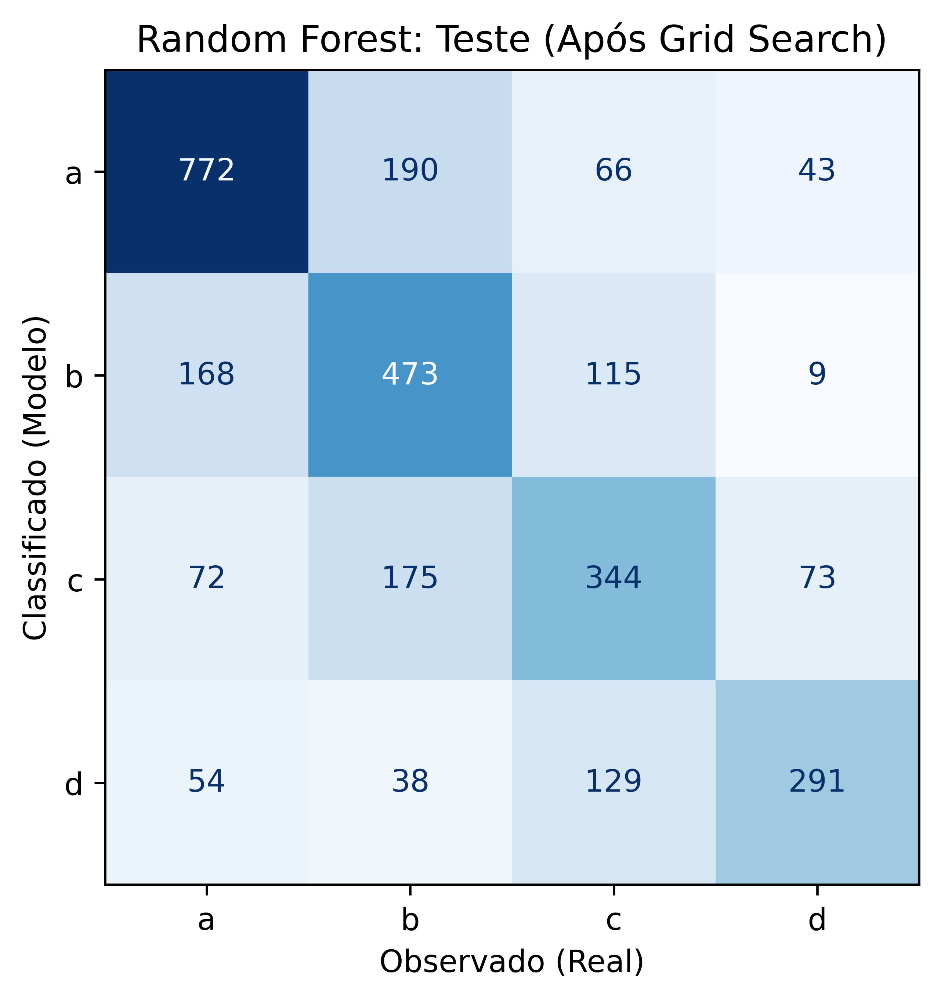

Avaliação da RF Após Grid Search (Base de Teste)
Acurácia: 62.4%
Sensibilidade: 62.4%
Especificidade: 62.4%
Precision: 62.6%
F1-Score Ponderado: 62.33%


In [77]:
rf_grid_cm_test = confusion_matrix(rf_grid_pred_test_class, y_test)
cm_rf_grid_test = ConfusionMatrixDisplay(rf_grid_cm_test, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_rf_grid_test.plot(colorbar=False, cmap='Blues')
plt.title('Random Forest: Teste (Após Grid Search)')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

acc_rf_grid_test = accuracy_score(y_test, rf_grid_pred_test_class)
sens_rf_grid_test = recall_score(y_test, rf_grid_pred_test_class, pos_label=1, average='weighted')
espec_rf_grid_test = recall_score(y_test, rf_grid_pred_test_class, pos_label=0, average='weighted')
prec_rf_grid_test = precision_score(y_test, rf_grid_pred_test_class, average='weighted')
f1_rf_grid_train = f1_score(y_test, rf_grid_pred_test_class, average='weighted')

print("Avaliação da RF Após Grid Search (Base de Teste)")
print(f"Acurácia: {acc_rf_grid_test:.1%}")
print(f"Sensibilidade: {sens_rf_grid_test:.1%}")
print(f"Especificidade: {espec_rf_grid_test:.1%}")
print(f"Precision: {prec_rf_grid_test:.1%}")
print(f"F1-Score Ponderado: {f1_rf_grid_train:.2%}")


###Importância dos valores preditos

In [68]:
rf_features = pd.DataFrame({'features':X_train_sem_acm.columns.tolist(),
                            'importance':rf_best.feature_importances_})

print(rf_features)

          features  importance
0         fx_preco    0.284031
1      joia_brinco    0.058499
2       joia_colar    0.039956
3    joia_pingente    0.033535
4    joia_pulseira    0.035714
5     pedra_outras    0.320998
6  pedra_sem pedra    0.084119
7   marca_nacional    0.143149


##Último Teste: RF com ACM

###Estima a RF com as coordenadas da ACM

In [69]:
rf_clf_acm = RandomForestClassifier(n_estimators=50,
                                max_depth=4,
                                #max_features=20, #Removi esta configuração para testar
                                random_state=42)
rf_clf_acm.fit(X_train_com_acm, y_train)

RandomForestClassifier(max_depth=4, n_estimators=50, random_state=42)

###Obtendo os valores preditos da RF com ACM

In [70]:
# Predict na base de treinamento
rf_pred_train_class_acm = rf_clf_acm.predict(X_train_com_acm)
rf_pred_train_prob_acm = rf_clf_acm.predict_proba(X_train_com_acm)

# Predict na base de testes
rf_pred_test_class_acm = rf_clf_acm.predict(X_test_com_acm)
rf_pred_test_prob_acm = rf_clf_acm.predict_proba(X_test_com_acm)

###Matriz de confusão Treino RF com ACM (Treino)

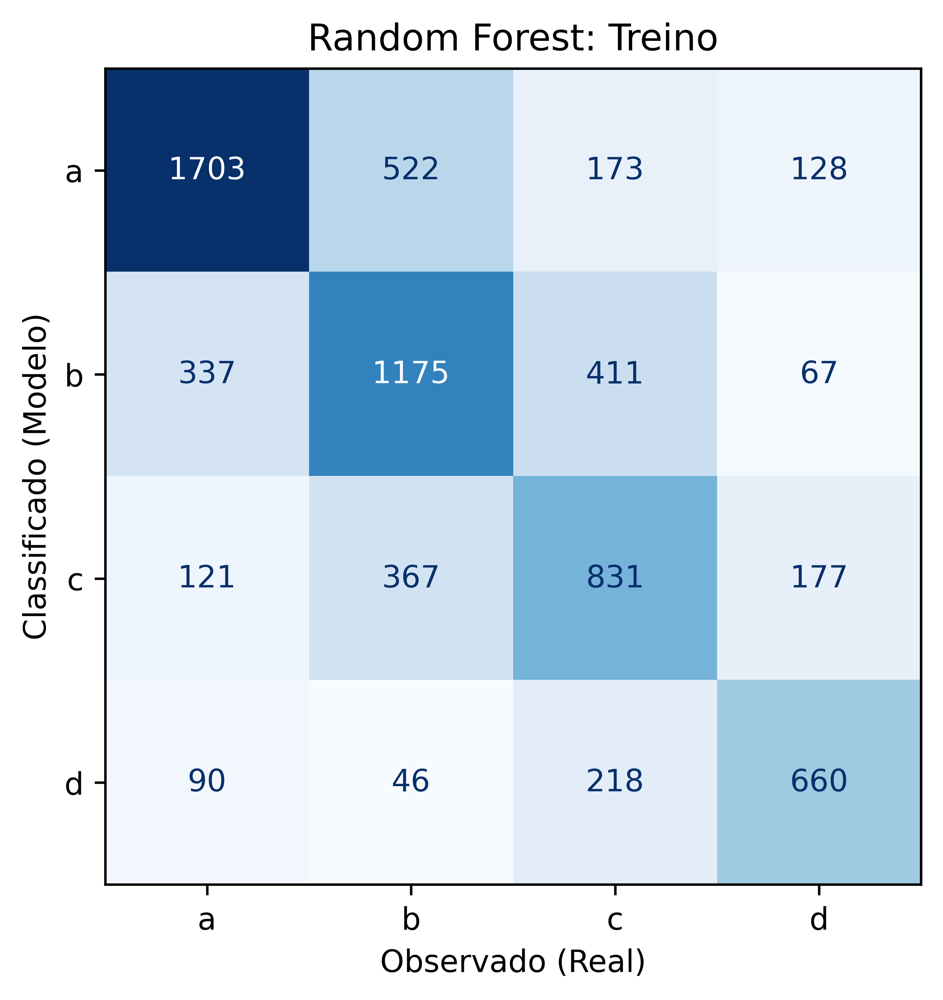

Avaliação da RF (Base de Treino)
Acurácia: 62.2%
Sensibilidade (Recall Ponderado): 62.2%
Especificidade: 62.2%
Precisão Ponderada: 63.0%
F1-Score Ponderado: 62.5%


In [71]:
# --- Plotagem da Matriz de Confusão ---
rf_cm_train = confusion_matrix(y_train, rf_pred_train_class_acm) # Ordem padrão: (valores_reais, valores_previstos)
cm_rf_train = ConfusionMatrixDisplay(rf_cm_train, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_rf_train.plot(colorbar=False, cmap='Blues')
plt.title('Random Forest: Treino')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_rf_train = accuracy_score(y_train, rf_pred_train_class_acm)
sens_rf_train = recall_score(y_train, rf_pred_train_class_acm, average='weighted')
espec_rf_train = recall_score(y_train, rf_pred_train_class_acm, pos_label=0, average='weighted')
prec_rf_train = precision_score(y_train, rf_pred_train_class_acm, average='weighted')
# ADICIONADO: Cálculo do F1-Score Ponderado
f1_rf_train = f1_score(y_train, rf_pred_train_class_acm, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da RF (Base de Treino)")
print(f"Acurácia: {acc_rf_train:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_rf_train:.1%}")
print(f"Especificidade: {espec_rf_train:.1%}")
print(f"Precisão Ponderada: {prec_rf_train:.1%}")
# ADICIONADO: Exibição do F1-Score Ponderado
print(f"F1-Score Ponderado: {f1_rf_train:.1%}")

###Matriz de confusão Teste RF com ACM (Teste)

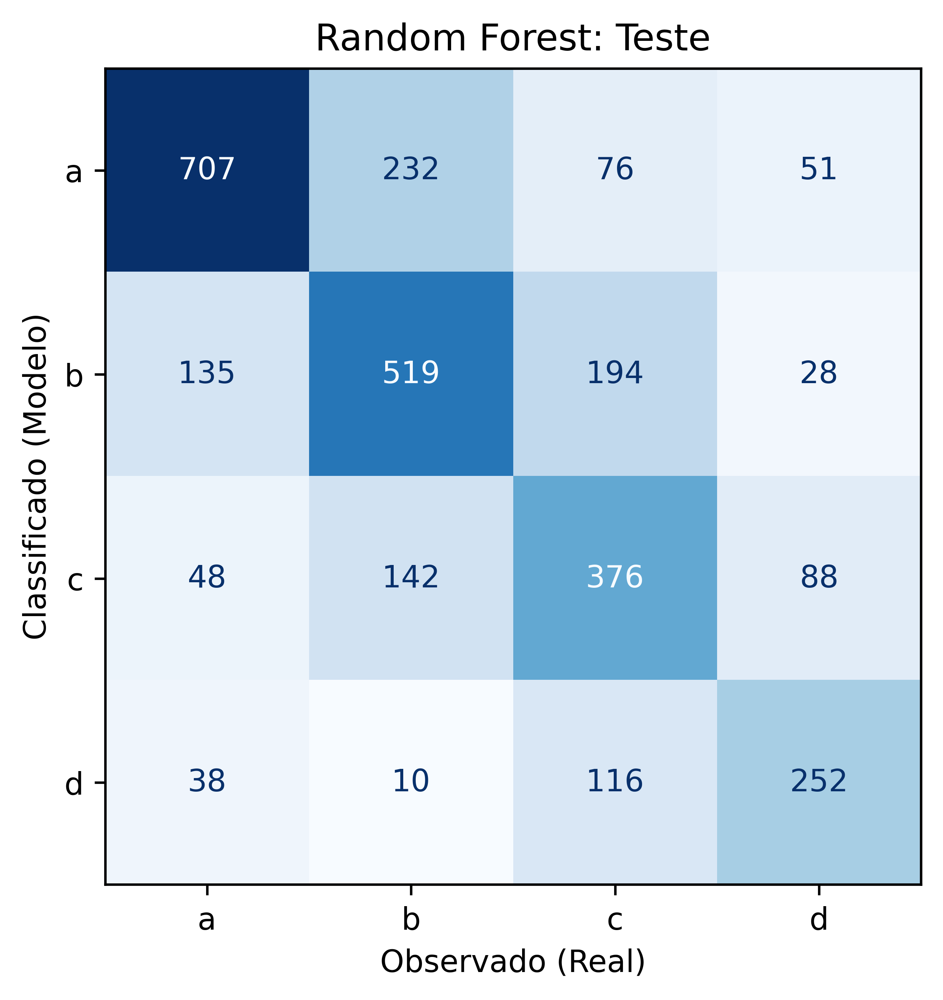

Avaliação da RF (Base de Teste)
Acurácia: 61.6%
Sensibilidade (Recall Ponderado): 61.6%
Especificidade: 61.6%
Precisão Ponderada: 62.7%
F1-Score Ponderado: 61.9%


In [72]:
# --- Plotagem da Matriz de Confusão ---
rf_cm_test = confusion_matrix(y_test, rf_pred_test_class_acm) # Ordem padrão: (valores_reais, valores_previstos)
cm_rf_test = ConfusionMatrixDisplay(rf_cm_test, display_labels=['a', 'b', 'c', 'd'])

plt.rcParams['figure.dpi'] = 600
cm_rf_test.plot(colorbar=False, cmap='Blues')
plt.title('Random Forest: Teste')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- Cálculo das Métricas ---
acc_rf_test = accuracy_score(y_test, rf_pred_test_class_acm)
sens_rf_test = recall_score(y_test, rf_pred_test_class_acm, average='weighted')
espec_rf_test = recall_score(y_test, rf_pred_test_class_acm, pos_label=0, average='weighted')
prec_rf_test = precision_score(y_test, rf_pred_test_class_acm, average='weighted')
# ADICIONADO: Cálculo do F1-Score Ponderado
f1_rf_test = f1_score(y_test, rf_pred_test_class_acm, average='weighted')

# --- Exibição dos Resultados ---
print("Avaliação da RF (Base de Teste)")
print(f"Acurácia: {acc_rf_test:.1%}")
print(f"Sensibilidade (Recall Ponderado): {sens_rf_test:.1%}")
print(f"Especificidade: {espec_rf_test:.1%}")
print(f"Precisão Ponderada: {prec_rf_test:.1%}")
# ADICIONADO: Exibição do F1-Score Ponderado
print(f"F1-Score Ponderado: {f1_rf_test:.1%}")

###Grid Search para RF com ACM

In [73]:
# Vamos especificar a lista de hiperparâmetros desejados e seus valores
param_grid_rf = {
    'n_estimators': [10, 50, 500],
    'max_depth': [3, 6, 10],
    'max_features': [3, 6, None],
    #'min_samples_split': [10, 100, 500]
}

# Identificar o algoritmo em uso
rf_grid = RandomForestClassifier(random_state=42)

# Treinar os modelos para o grid search
rf_grid_model = GridSearchCV(estimator = rf_grid,
                             param_grid = param_grid_rf,
                             #scoring='accuracy',
                             scoring='f1_weighted',
                             cv=5, verbose=2)

rf_grid_model.fit(X_train_com_acm, y_train)

# Verificando os melhores parâmetros obtidos
rf_grid_model.best_params_

# Gerando o modelo com os melhores hiperparâmetros
rf_best = rf_grid_model.best_estimator_

# Predict na base de treino
rf_grid_pred_train_class_acm = rf_best.predict(X_train_com_acm)
rf_grid_pred_train_prob_acm = rf_best.predict_proba(X_train_com_acm)

# Predict na base de testes
rf_grid_pred_test_class_acm = rf_best.predict(X_test_com_acm)
rf_grid_pred_test_prob_acm = rf_best.predict_proba(X_test_com_acm)

Fitting 5 folds for each of 27 candidates, totalling 135 fits
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=10; total time=   0.0s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END .......max_depth=3, max_features=3, n_estimators=50; total time=   0.1s
[CV] END ......max_depth=3, max_features=3, n_estimators=500; total time=   0.9s
[CV] END ......max_depth=3, max_features=3, n_e

###Matriz de Confusão Treino RF ACM Otimizada

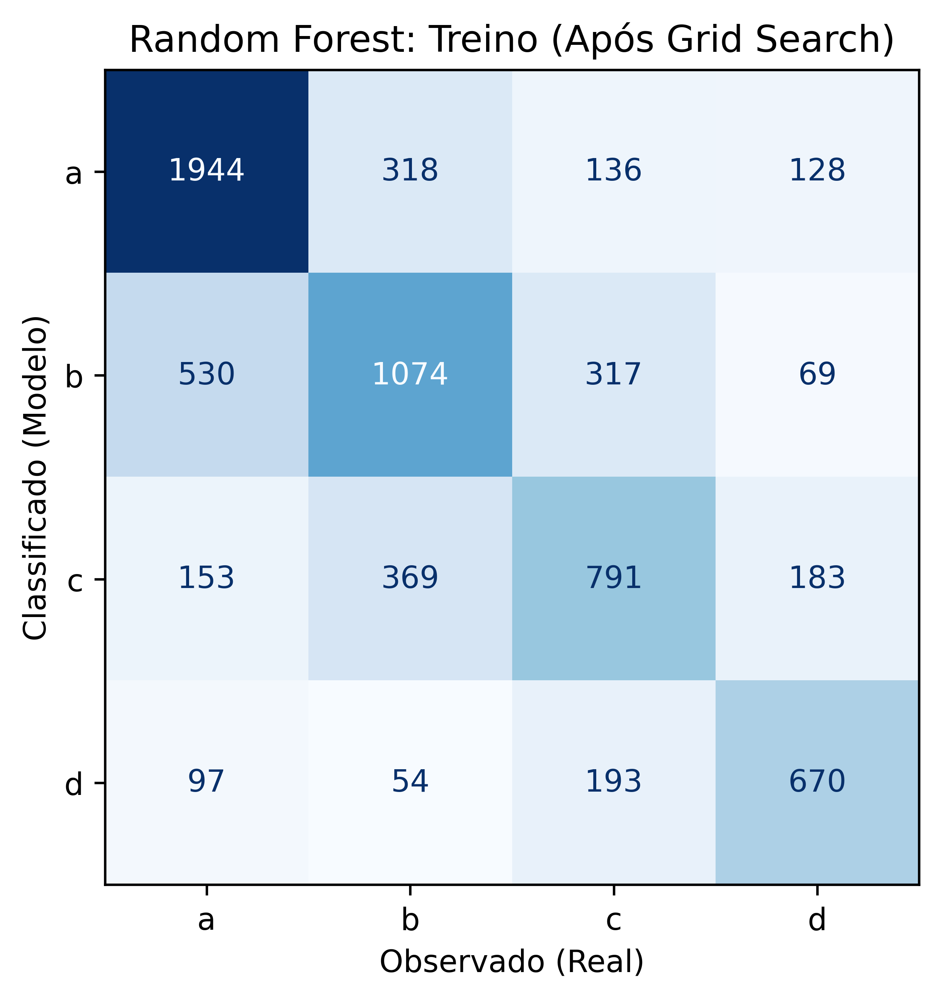

Avaliação da RF Após Grid Search (Base de Treino)
Acurácia: 63.7%
Sensibilidade: 63.7%
Precisão Ponderada: 63.3%
F1-Score Ponderado: 63.5%


In [74]:
# --- 1. Cálculo das Métricas (incluindo o F1-Score) ---
acc_rf_grid_train = accuracy_score(y_train, rf_grid_pred_train_class_acm)
sens_rf_grid_train = recall_score(y_train, rf_grid_pred_train_class_acm, average='weighted')
prec_rf_grid_train = precision_score(y_train, rf_grid_pred_train_class_acm, average='weighted')
# Adicionamos o cálculo do F1-Score ponderado
f1_rf_grid_train = f1_score(y_train, rf_grid_pred_train_class_acm, average='weighted')

# --- 2. Geração da Matriz de Confusão ---
rf_grid_cm_train = confusion_matrix(y_train, rf_grid_pred_train_class_acm) # Correção na ordem dos argumentos
cm_rf_grid_train = ConfusionMatrixDisplay(rf_grid_cm_train, display_labels=['a', 'b', 'c', 'd'])

# --- 3. Plotagem com o Título Dinâmico ---
cm_rf_grid_train.plot(colorbar=False, cmap='Blues')

# Modificamos o título para incluir o valor do F1-Score formatado
plt.title(f"Random Forest: Treino (Após Grid Search)")

plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

# --- 4. Exibição de todas as métricas ---
print("Avaliação da RF Após Grid Search (Base de Treino)")
print(f"Acurácia: {acc_rf_grid_train:.1%}")
print(f"Sensibilidade: {sens_rf_grid_train:.1%}")
# A especificidade em multiclasse é complexa, mantemos a sua abordagem por consistência
# espec_rf_grid_train = ...
print(f"Precisão Ponderada: {prec_rf_grid_train:.1%}")
print(f"F1-Score Ponderado: {f1_rf_grid_train:.1%}")

###Matriz de Confusão Teste RF ACM Otimizada

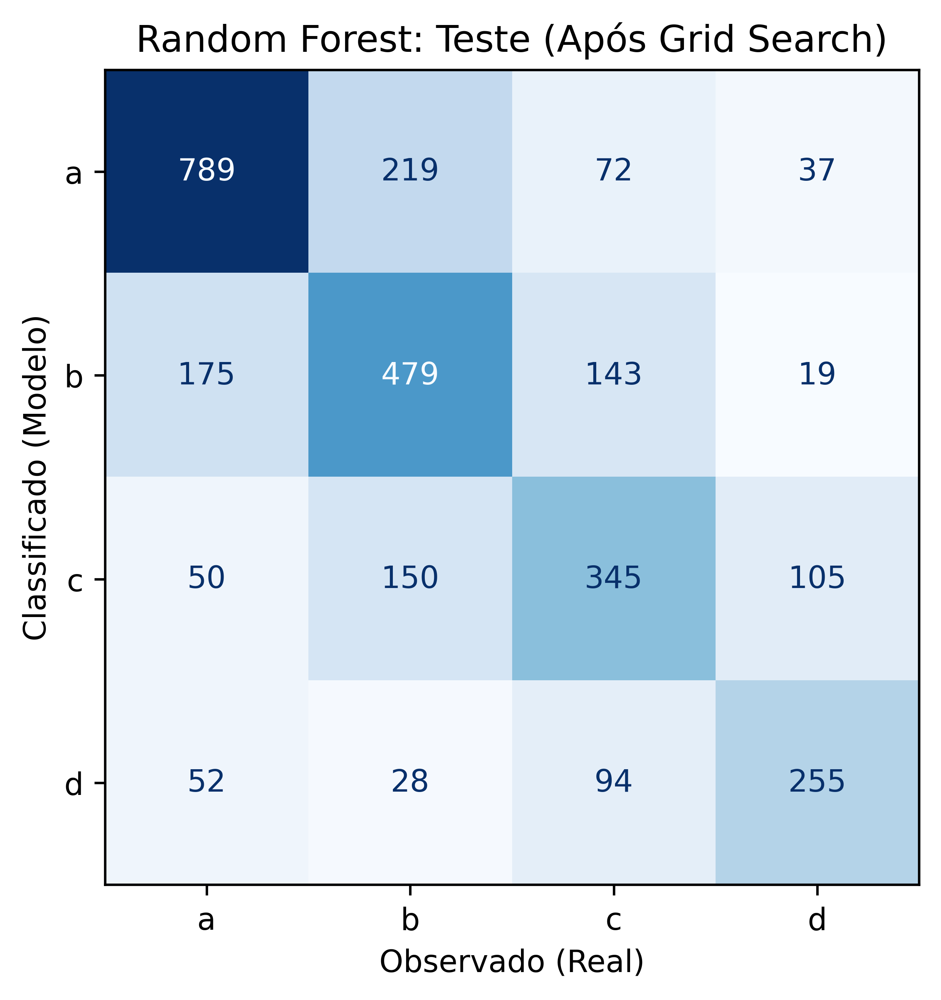

Avaliação da RF Após Grid Search (Base de Teste)
Acurácia: 62.0%
Sensibilidade: 62.0%
Especificidade: 62.0%
Precision: 61.8%
F1-Score Ponderado: 61.88%


In [78]:
rf_grid_cm_test = confusion_matrix(rf_grid_pred_test_class_acm, y_test)
cm_rf_grid_test = ConfusionMatrixDisplay(rf_grid_cm_test, display_labels=['a', 'b', 'c', 'd'])

cm_rf_grid_test.plot(colorbar=False, cmap='Blues')
plt.title('Random Forest: Teste (Após Grid Search)')
plt.xlabel('Observado (Real)')
plt.ylabel('Classificado (Modelo)')
plt.show()

acc_rf_grid_test = accuracy_score(y_test, rf_grid_pred_test_class_acm)
sens_rf_grid_test = recall_score(y_test, rf_grid_pred_test_class_acm, pos_label=1, average='weighted')
espec_rf_grid_test = recall_score(y_test, rf_grid_pred_test_class_acm, pos_label=0, average='weighted')
prec_rf_grid_test = precision_score(y_test, rf_grid_pred_test_class_acm, average='weighted')
f1_rf_grid_train = f1_score(y_test, rf_grid_pred_test_class_acm, average='weighted')

print("Avaliação da RF Após Grid Search (Base de Teste)")
print(f"Acurácia: {acc_rf_grid_test:.1%}")
print(f"Sensibilidade: {sens_rf_grid_test:.1%}")
print(f"Especificidade: {espec_rf_grid_test:.1%}")
print(f"Precision: {prec_rf_grid_test:.1%}")
print(f"F1-Score Ponderado: {f1_rf_grid_train:.2%}")


# Identifica as versões dos pacotes para documentação

In [82]:
pip show scikit-learn

Name: scikit-learn
Version: 1.6.1
Summary: A set of python modules for machine learning and data mining
Home-page: https://scikit-learn.org
Author: 
Author-email: 
License: BSD 3-Clause License

 Copyright (c) 2007-2024 The scikit-learn developers.
 All rights reserved.

 Redistribution and use in source and binary forms, with or without
 modification, are permitted provided that the following conditions are met:

 * Redistributions of source code must retain the above copyright notice, this
   list of conditions and the following disclaimer.

 * Redistributions in binary form must reproduce the above copyright notice,
   this list of conditions and the following disclaimer in the documentation
   and/or other materials provided with the distribution.

 * Neither the name of the copyright holder nor the names of its
   contributors may be used to endorse or promote products derived from
   this software without specific prior written permission.

 THIS SOFTWARE IS PROVIDED BY THE COPYR